# Outliers Analysis

The data here is not imputed, the missing values are just dropped.

A deep analysis of the peaks on the Absorbance is performed to understand if the frequency of peaks is increasing or not in time.

Here the outliers for each variable of each site are analyzed in order to find some patterns between outliers of different variables. The main goal is to understand if a sample is a real outlier or an 'analytical' one due to an error in the measurement.

A unique dataset is built, appending to the Xerta one the variables that are not measured in Xerta.

The variables are:
* Air Temperature (Guiamets)
* Daily Cumulated Rainfall (Tortosa, since it is the closest city to Xerta)
* Flow River (Tortosa)

In [55]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.api as sm

In [56]:
plt.rcParams["figure.figsize"] = [20, 10]
plt.rcParams.update({"font.size": 18})

# Utils

In [57]:
def build_dict_from_folder(folder_path):
    datasets_dict = {}
    for folder in os.listdir(folder_path):
        if os.path.isdir(os.path.join(folder_path, folder)):
            datasets_dict[folder] = {}
            for file in os.listdir(os.path.join(folder_path, folder)):
                feature_name = file.split(".")[0]
                datasets_dict[folder][feature_name] = pd.read_excel(
                    os.path.join(folder_path, folder, file)
                )
    return datasets_dict

# Load Data

In [93]:
data_folder = os.path.join("..", "data")

raw_data_folder = os.path.join(
    data_folder, "raw_data"
)

intermediate_data_folder = os.path.join(
    data_folder, "intermediate_data"
)

probabilities_folder = os.path.join(
    data_folder, "probabilities"
)

In [59]:
datasets_dict = build_dict_from_folder(intermediate_data_folder)

In [60]:
datasets_dict.keys()

dict_keys(['GUIAMETS', 'MEQUINENZA', 'XERTA', 'TORTOSA'])

In [61]:
tortosa_dfs = datasets_dict["TORTOSA"]
guiamets_dfs = datasets_dict["GUIAMETS"]
mequinenza_dfs = datasets_dict["MEQUINENZA"]
xerta_dfs = datasets_dict["XERTA"]

## Get Common Time Range for valid analysis

In [62]:
# get common time range for all datasets
min_tortosa = max(
    min(tortosa_dfs[feature]["DateTime"])
    for feature in tortosa_dfs.keys()
)
max_tortosa = min(
    max(tortosa_dfs[feature]["DateTime"])
    for feature in tortosa_dfs.keys()
)

min_guiamets = max(
    min(guiamets_dfs[feature]["DateTime"])
    for feature in guiamets_dfs.keys()
)
max_guiamets = min(
    max(guiamets_dfs[feature]["DateTime"])
    for feature in guiamets_dfs.keys()
)

min_mequinenza = max(
    min(mequinenza_dfs[feature]["DateTime"])
    for feature in mequinenza_dfs.keys()
)
max_mequinenza = min(
    max(mequinenza_dfs[feature]["DateTime"])
    for feature in mequinenza_dfs.keys()
)

min_xerta = max(
    min(xerta_dfs[feature]["DateTime"]) for feature in xerta_dfs.keys()
)
max_xerta = min(
    max(xerta_dfs[feature]["DateTime"]) for feature in xerta_dfs.keys()
)

min_date = max(min_tortosa, min_guiamets, min_mequinenza, min_xerta)
max_date = min(max_tortosa, max_guiamets, max_mequinenza, max_xerta)

In [63]:
for feature in tortosa_dfs.keys():
    tortosa_dfs[feature] = tortosa_dfs[feature].loc[
        (tortosa_dfs[feature]["DateTime"] >= min_date)
        & (tortosa_dfs[feature]["DateTime"] <= max_date)
    ]

for feature in guiamets_dfs.keys():
    guiamets_dfs[feature] = guiamets_dfs[feature].loc[
        (guiamets_dfs[feature]["DateTime"] >= min_date)
        & (guiamets_dfs[feature]["DateTime"] <= max_date)
    ]

for feature in mequinenza_dfs.keys():
    mequinenza_dfs[feature] = mequinenza_dfs[feature].loc[
        (mequinenza_dfs[feature]["DateTime"] >= min_date)
        & (mequinenza_dfs[feature]["DateTime"] <= max_date)
    ]

for feature in xerta_dfs.keys():
    xerta_dfs[feature] = xerta_dfs[feature].loc[
        (xerta_dfs[feature]["DateTime"] >= min_date)
        & (xerta_dfs[feature]["DateTime"] <= max_date)
    ]

# Tortosa

In [64]:
for feature, df in tortosa_dfs.items():
    df = df.set_index("DateTime")

    all_dates = pd.date_range(
        start=df.index.min(), end=df.index.max(), freq="D"
    )
    df = df.reindex(all_dates, fill_value=None)

    df.reset_index(inplace=True)
    df.rename(columns={"index": "DateTime"}, inplace=True)
    tortosa_dfs[feature] = df

In [65]:
feature, tortosa_df = list(tortosa_dfs.items())[0]

tortosa_df = tortosa_df[["DateTime", "Average"]]

tortosa_df.rename(columns={"Average": feature}, inplace=True)

for feature, df in list(tortosa_dfs.items())[1:]:
    df = df[["DateTime", "Average"]]
    df.rename(columns={"Average": feature}, inplace=True)
    tortosa_df = tortosa_df.merge(df, on="DateTime", how="inner")

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_76610/1994128918.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"Average": feature}, inplace=True)
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_76610/1994128918.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"Average": feature}, inplace=True)
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_76610/1994128918.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

In [66]:
tortosa_df

,DateTime,cumulated_rainfall_24h,turbidity,watertemperature,conductivity,flowriver
0,2012-08-29,0.0,4.42,27.75,1412.61,100.82
1,2012-08-30,0.4,0.99,26.78,1003.79,97.40
2,2012-08-31,0.0,1.08,25.35,1371.54,95.59
3,2012-09-01,0.0,7.96,23.93,1390.08,94.97
4,2012-09-02,0.0,2.92,23.30,1394.38,95.48
...,...,...,...,...,...,...
4045,2023-09-26,0.0,1.86,25.51,1424.07,83.50
4046,2023-09-27,0.0,2.77,26.05,1403.93,81.17
4047,2023-09-28,0.0,2.07,26.35,1390.99,81.42
4048,2023-09-29,0.0,1.59,26.54,1392.94,80.71


In [67]:
# drop turbidity since it has a lot of missing values
tortosa_df = tortosa_df.drop(columns=["turbidity"])

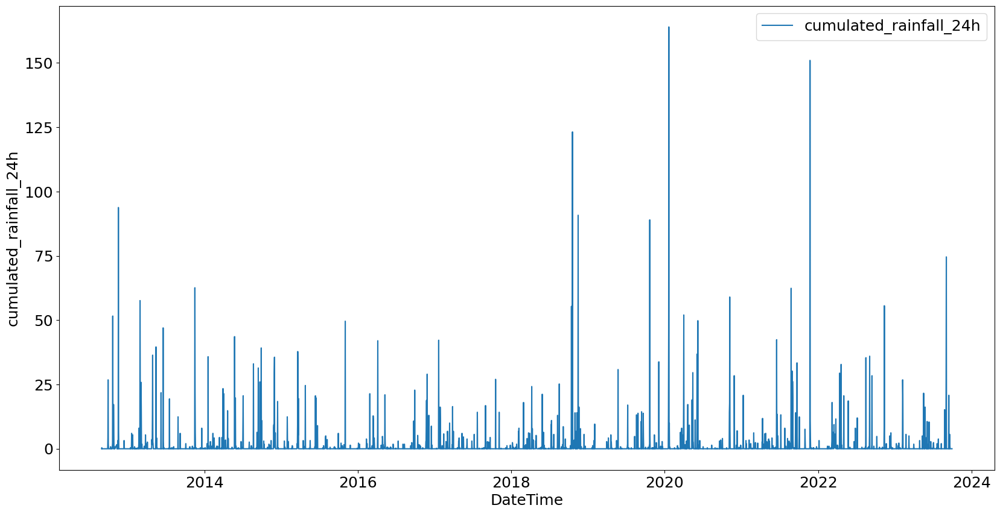

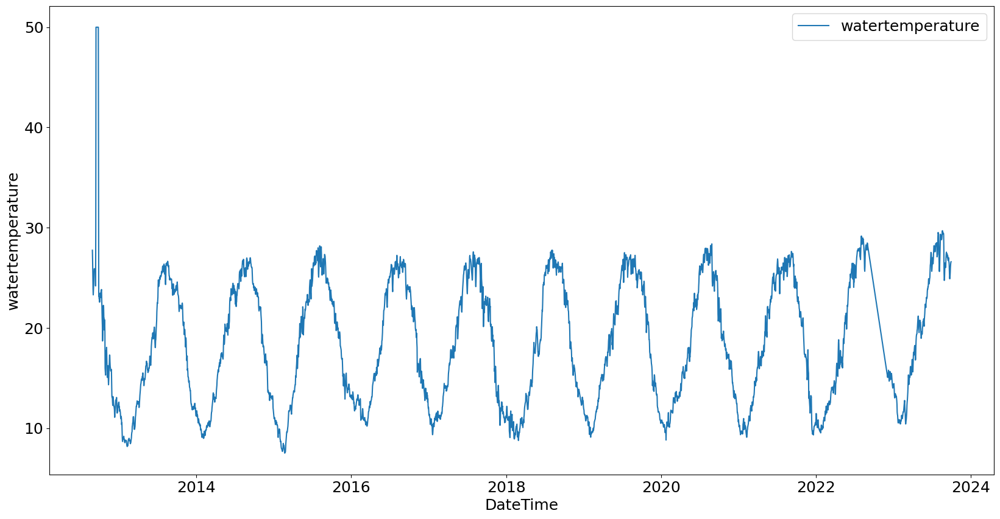

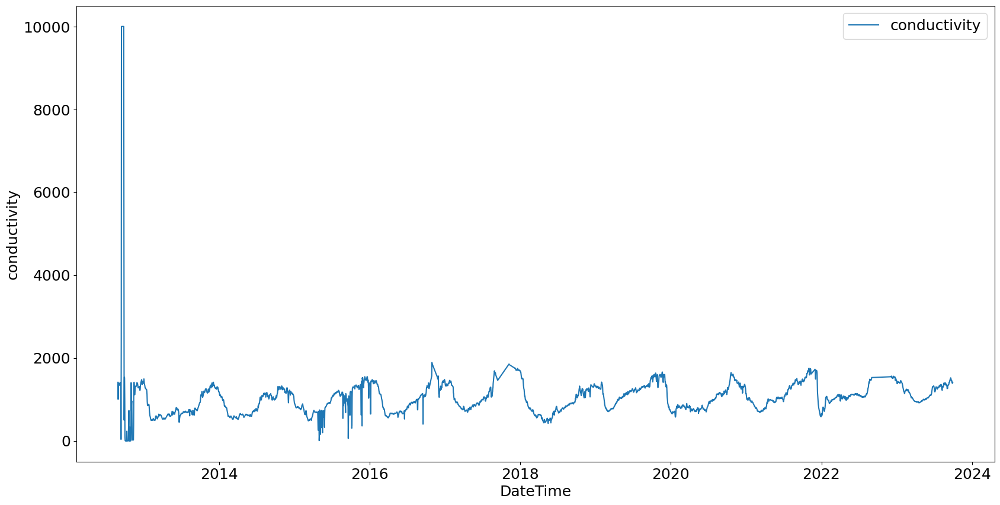

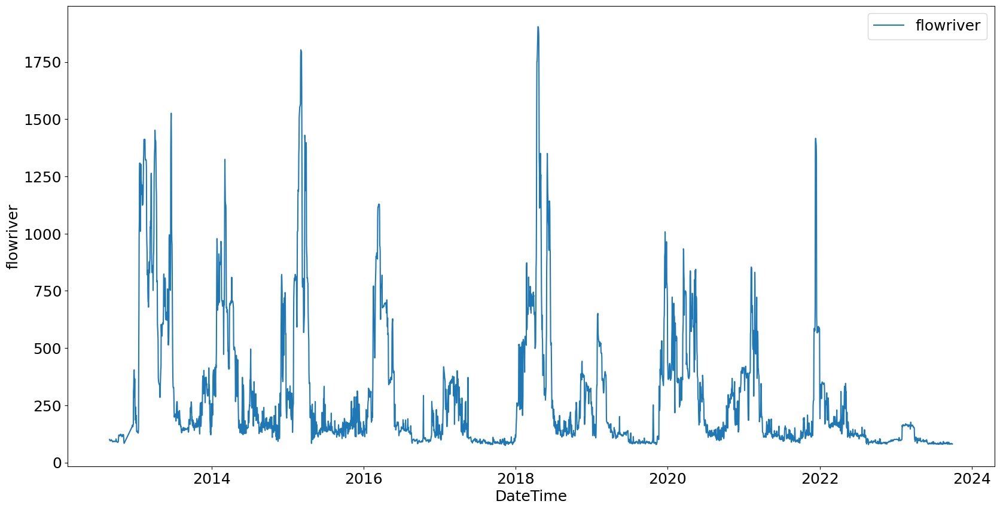

In [68]:
for feature in tortosa_df.columns[1:]:
    plt.figure()
    sns.lineplot(
        x="DateTime", y=feature, data=tortosa_df, label=feature
    )

In [69]:
# scale the data
from sklearn.preprocessing import MinMaxScaler

scaled_tortosa_df = tortosa_df.copy()

scaler = MinMaxScaler()
scaled_tortosa_df[scaled_tortosa_df.columns[1:]] = scaler.fit_transform(
    tortosa_df[tortosa_df.columns[1:]]
)

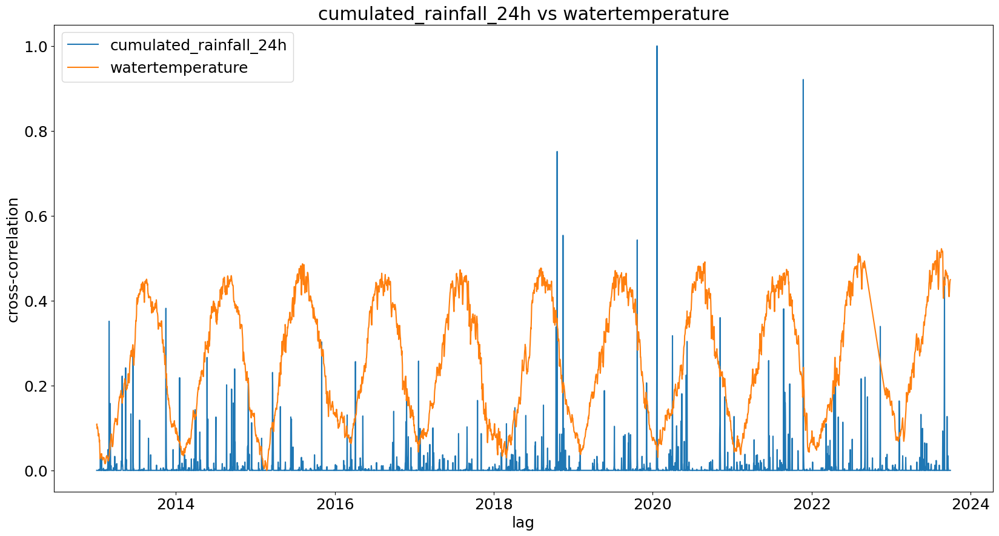

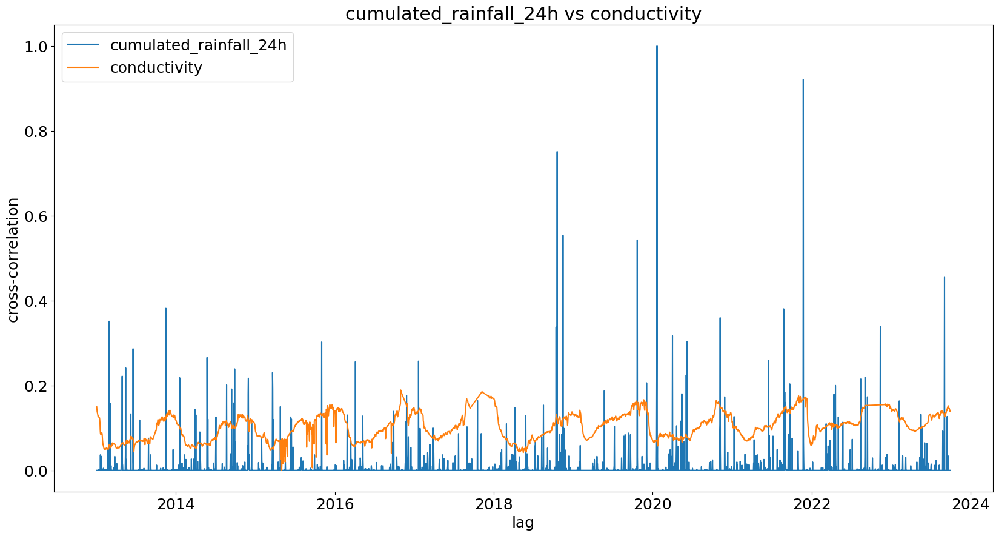

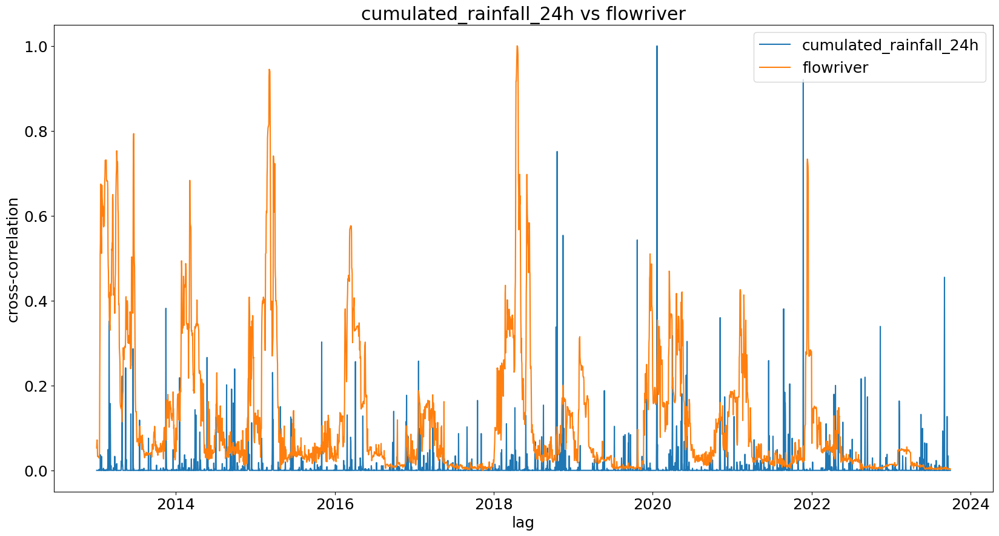

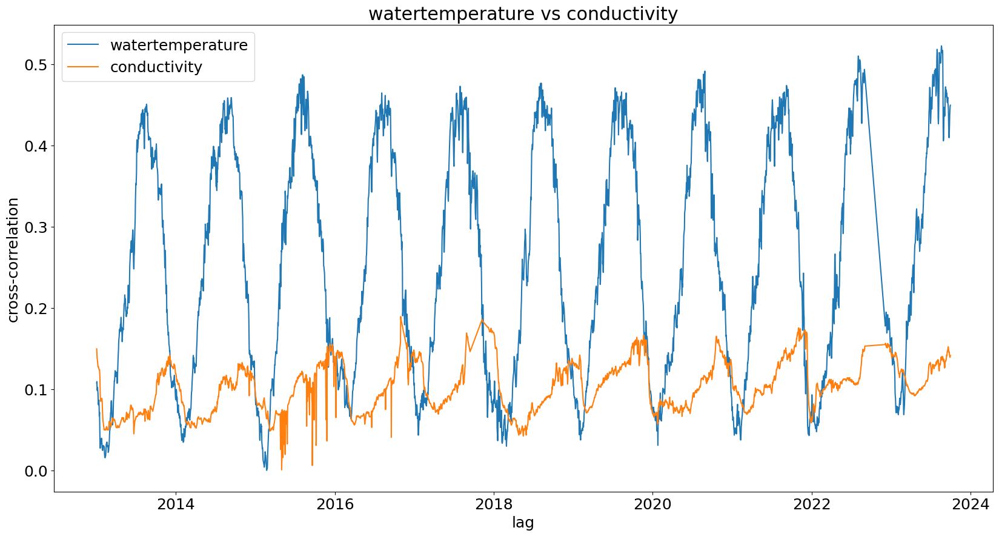

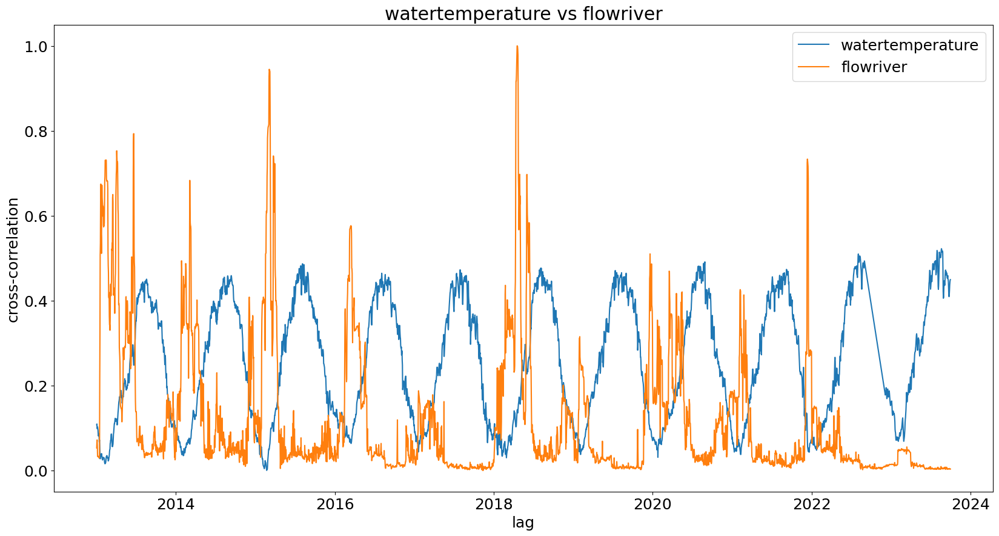

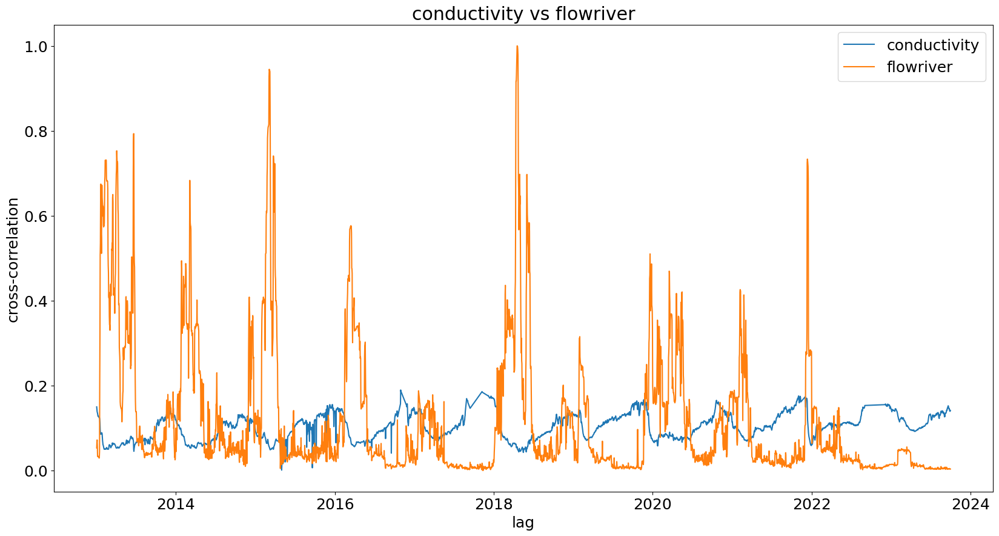

In [70]:
# plot every combination of features
from scipy import signal
import scipy


for i, feature1 in enumerate(tortosa_df.columns[1:]):
    for j, feature2 in enumerate(tortosa_df.columns[1:]):
        if i < j:
            """# cross correlation
            product_df = pd.DataFrame()
            product_df["DateTime"] = tortosa_df["DateTime"]
            product_df["product"] = (
                scaled_tortosa_df[feature1] * scaled_tortosa_df[feature2]
            )
            product_df[feature1] = tortosa_df[feature1] * product_df["product"]
            product_df[feature2] = tortosa_df[feature2] * product_df["product"]

            scaler = MinMaxScaler()
            product_df[product_df.columns[1:]] = scaler.fit_transform(
                product_df[product_df.columns[1:]]
            )

            # fig, axs = plt.subplots(2, 1, figsize=(20, 10))

            ccf = signal.correlate(
                tortosa_df[feature1], tortosa_df[feature2], mode="full"
            )

            ccf /= np.max(ccf)
            ccf = ccf[int((len(ccf) - 1) / 2) :]
            lags = np.arange(0, len(ccf))

            max_lag = lags[np.argmax(ccf)]

            peaks = scipy.signal.find_peaks(tortosa_df[feature1])"""

            sns.lineplot(
                x="DateTime",
                y=feature1,
                data=scaled_tortosa_df[
                    scaled_tortosa_df["DateTime"] > "2013"
                ],
                label=feature1,
            )
            sns.lineplot(
                x="DateTime",
                y=feature2,
                data=scaled_tortosa_df[
                    scaled_tortosa_df["DateTime"] > "2013"
                ],
                label=feature2,
            )

            plt.xlabel("lag")
            plt.ylabel("cross-correlation")
            plt.title(f"{feature1} vs {feature2}")
            plt.show()

# Guiamets

In [71]:
for feature, df in guiamets_dfs.items():
    df = df.set_index("DateTime")

    all_dates = pd.date_range(
        start=df.index.min(), end=df.index.max(), freq="D"
    )
    df = df.reindex(all_dates, fill_value=None)

    df.reset_index(inplace=True)
    df.rename(columns={"index": "DateTime"}, inplace=True)
    guiamets_dfs[feature] = df

In [72]:
feature, guiamets_df = list(guiamets_dfs.items())[0]

guiamets_df = guiamets_df[["DateTime", "Average"]]

guiamets_df.rename(columns={"Average": feature}, inplace=True)

for feature, df in list(guiamets_dfs.items())[1:]:
    df = df[["DateTime", "Average"]]
    df.rename(columns={"Average": feature}, inplace=True)
    guiamets_df = guiamets_df.merge(df, on="DateTime", how="inner")

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_76610/1136476845.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"Average": feature}, inplace=True)


In [73]:
guiamets_df

,DateTime,cumulated_rainfall_24h,environmental_temperature
0,2012-08-29,0.0,27.02
1,2012-08-30,1.6,22.49
2,2012-08-31,0.0,21.03
3,2012-09-01,0.0,17.81
4,2012-09-02,0.0,19.43
...,...,...,...
4045,2023-09-26,0.0,20.50
4046,2023-09-27,0.0,21.76
4047,2023-09-28,0.0,22.17
4048,2023-09-29,0.0,22.03


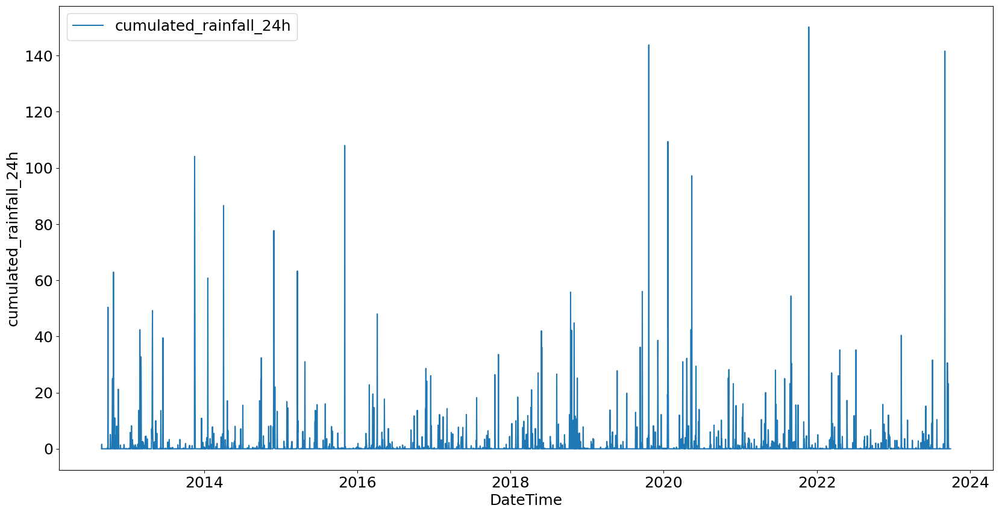

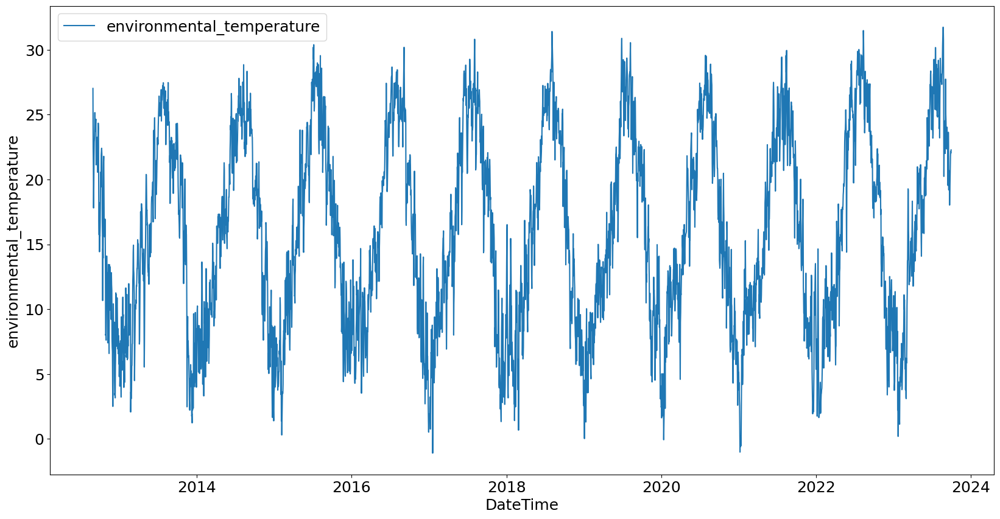

In [74]:
for feature in guiamets_df.columns[1:]:
    plt.figure()
    sns.lineplot(
        x="DateTime", y=feature, data=guiamets_df, label=feature
    )

In [75]:
# scale the data
from sklearn.preprocessing import MinMaxScaler

scaled_guiamets_df = guiamets_df.copy()

scaler = MinMaxScaler()
scaled_guiamets_df[
    scaled_guiamets_df.columns[1:]
] = scaler.fit_transform(guiamets_df[guiamets_df.columns[1:]])

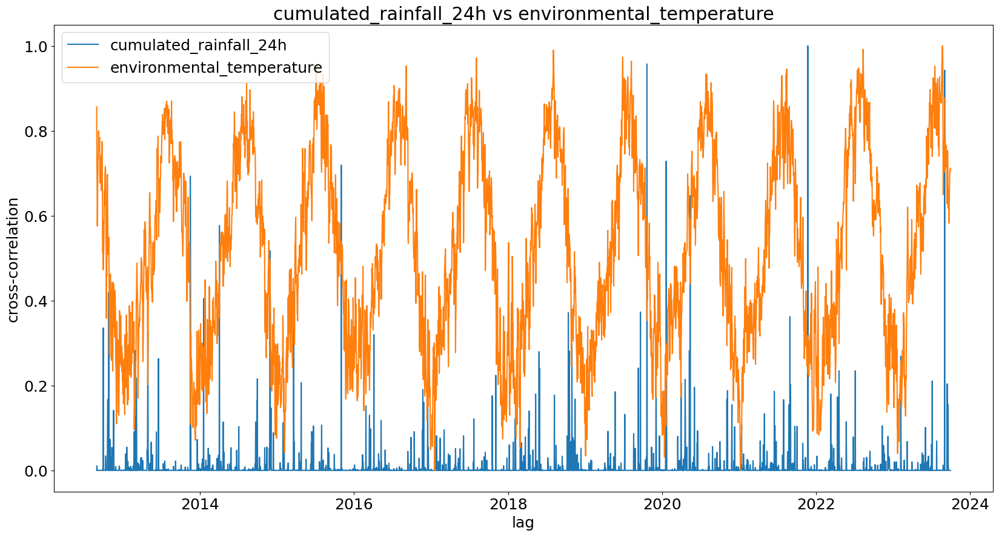

In [76]:
# plot every combination of features
from scipy import signal
import scipy


for i, feature1 in enumerate(guiamets_df.columns[1:]):
    for j, feature2 in enumerate(guiamets_df.columns[1:]):
        if i < j:
            """# cross correlation
            product_df = pd.DataFrame()
            product_df["DateTime"] = guiamets_df["DateTime"]
            product_df["product"] = (
                scaled_guiamets_df[feature1] * scaled_guiamets_df[feature2]
            )
            product_df[feature1] = guiamets_df[feature1] * product_df["product"]
            product_df[feature2] = guiamets_df[feature2] * product_df["product"]

            scaler = MinMaxScaler()
            product_df[product_df.columns[1:]] = scaler.fit_transform(
                product_df[product_df.columns[1:]]
            )

            # fig, axs = plt.subplots(2, 1, figsize=(20, 10))

            ccf = signal.correlate(
                guiamets_df[feature1], guiamets_df[feature2], mode="full"
            )

            ccf /= np.max(ccf)
            ccf = ccf[int((len(ccf) - 1) / 2) :]
            lags = np.arange(0, len(ccf))

            max_lag = lags[np.argmax(ccf)]

            peaks = scipy.signal.find_peaks(guiamets_df[feature1])"""

            sns.lineplot(
                x="DateTime",
                y=feature1,
                data=scaled_guiamets_df,
                label=feature1,
            )
            sns.lineplot(
                x="DateTime",
                y=feature2,
                data=scaled_guiamets_df,
                label=feature2,
            )

            plt.xlabel("lag")
            plt.ylabel("cross-correlation")
            plt.title(f"{feature1} vs {feature2}")
            plt.show()

# Mequinenza

In [77]:
for feature, df in mequinenza_dfs.items():
    print(feature)
    print()
    print(df.isna().sum())
    print()
    print("Min date:", df["DateTime"].min())
    print()
    print("Max date:", df["DateTime"].max())
    print()
    print("-" * 100)

cumulated_rainfall_24h

Average     0
DateTime    0
dtype: int64

Min date: 2012-08-29 00:00:00

Max date: 2023-09-30 00:00:00

----------------------------------------------------------------------------------------------------


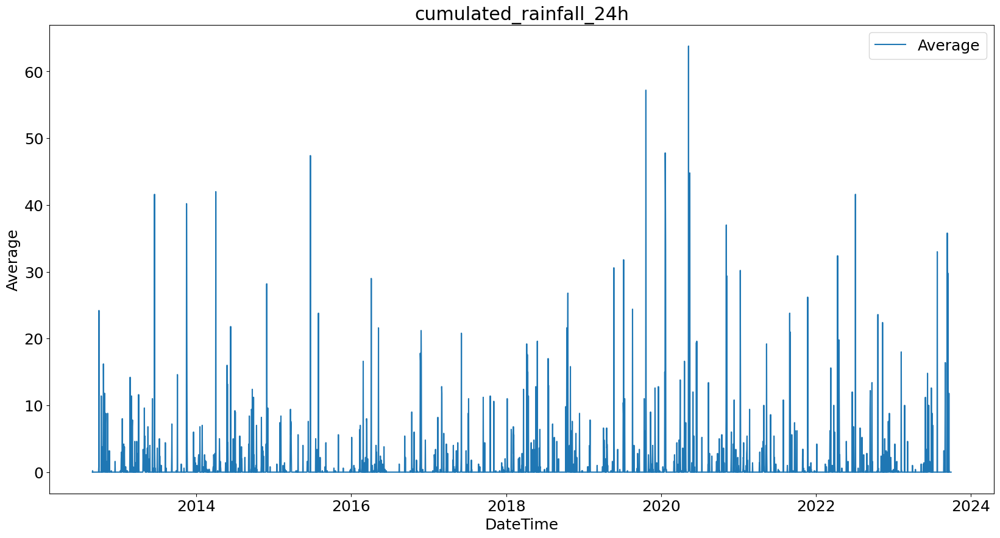

In [78]:
for feature, df in mequinenza_dfs.items():
    plt.figure(figsize=(20, 10))
    sns.lineplot(data=df, x="DateTime", y="Average", label="Average")
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

# Xerta

In [79]:
for feature, df in xerta_dfs.items():
    print(feature)
    print()
    print(df.isna().sum())
    print()
    print("Min date:", df["DateTime"].min())
    print()
    print("Max date:", df["DateTime"].max())
    print()
    print("-" * 100)

nitrate

DateTime    0
Average     0
Minimum     0
Maximum     0
Nºdat       0
NºOK        0
dtype: int64

Min date: 2012-08-29 00:00:00

Max date: 2023-09-30 00:00:00

----------------------------------------------------------------------------------------------------
pH

DateTime    0
Average     0
Minimum     0
Maximum     0
Nºdat       0
NºOK        0
dtype: int64

Min date: 2012-08-29 00:00:00

Max date: 2023-09-30 00:00:00

----------------------------------------------------------------------------------------------------
turbidity

DateTime    0
Average     0
Minimum     0
Maximum     0
Nºdat       0
NºOK        0
dtype: int64

Min date: 2012-08-29 00:00:00

Max date: 2023-09-30 00:00:00

----------------------------------------------------------------------------------------------------
Ammonium

DateTime    0
Average     0
Minimum     0
Maximum     0
Nºdat       0
NºOK        0
dtype: int64

Min date: 2012-08-29 00:00:00

Max date: 2023-09-30 00:00:00

-----------------------

In [80]:
for feature, df in xerta_dfs.items():
    df = df.set_index("DateTime")

    all_dates = pd.date_range(
        start=df.index.min(), end=df.index.max(), freq="D"
    )
    df = df.reindex(all_dates, fill_value=None)

    df.reset_index(inplace=True)
    df.rename(columns={"index": "DateTime"}, inplace=True)
    xerta_dfs[feature] = df

In [81]:
feature, xerta_df = list(xerta_dfs.items())[0]

xerta_df = xerta_df[["DateTime", "Average"]]

xerta_df.rename(columns={"Average": feature}, inplace=True)

for feature, df in list(xerta_dfs.items())[1:]:
    df = df[["DateTime", "Average"]]
    df.rename(columns={"Average": feature}, inplace=True)
    xerta_df = xerta_df.merge(df, on="DateTime", how="inner")

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_76610/2325347798.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xerta_df.rename(columns={"Average": feature}, inplace=True)
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_76610/2325347798.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"Average": feature}, inplace=True)
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_76610/2325347798.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

In [82]:
xerta_df

,DateTime,nitrate,pH,turbidity,Ammonium,dissolvedoxygen,watertemperature,Conductivity,redoxpotential,ABS254
0,2012-08-29,5.54,8.31,3.42,0.01,4.71,28.10,1144.98,220.47,9.07
1,2012-08-30,5.56,8.29,3.10,0.02,4.75,27.57,1205.67,225.81,15.13
2,2012-08-31,5.51,8.31,3.60,0.04,5.08,26.37,1237.20,229.83,15.95
3,2012-09-01,5.49,8.40,4.00,0.06,5.68,25.04,1254.15,231.82,NaN
4,2012-09-02,5.39,8.43,3.97,0.15,5.98,24.75,1244.10,234.80,15.10
...,...,...,...,...,...,...,...,...,...,...
4045,2023-09-26,7.56,8.30,3.96,0.03,5.46,25.95,1628.49,227.69,3.97
4046,2023-09-27,7.28,8.29,4.16,0.02,5.33,26.37,1610.67,227.02,3.81
4047,2023-09-28,7.34,8.27,3.80,0.02,5.23,26.60,1602.33,228.25,3.76
4048,2023-09-29,7.64,8.25,3.89,0.03,5.17,26.73,1613.81,230.54,4.18


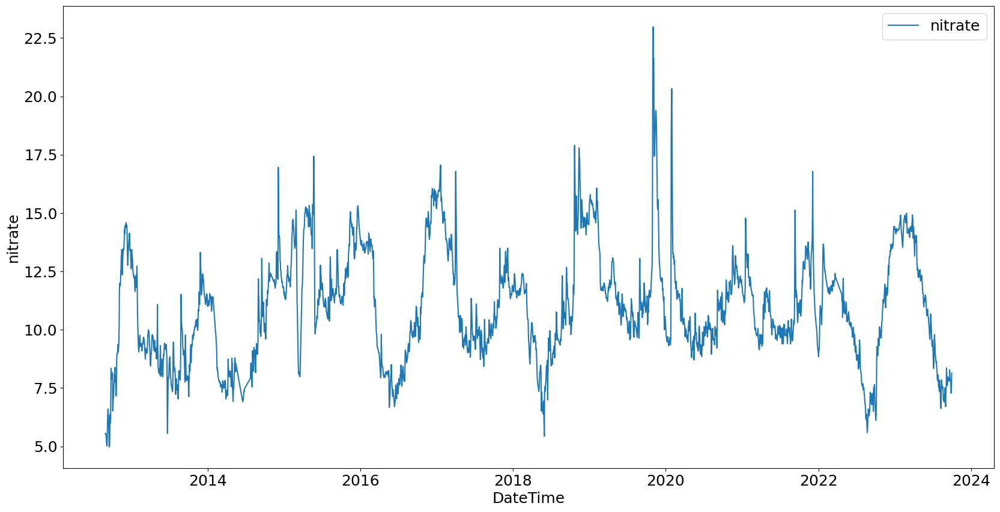

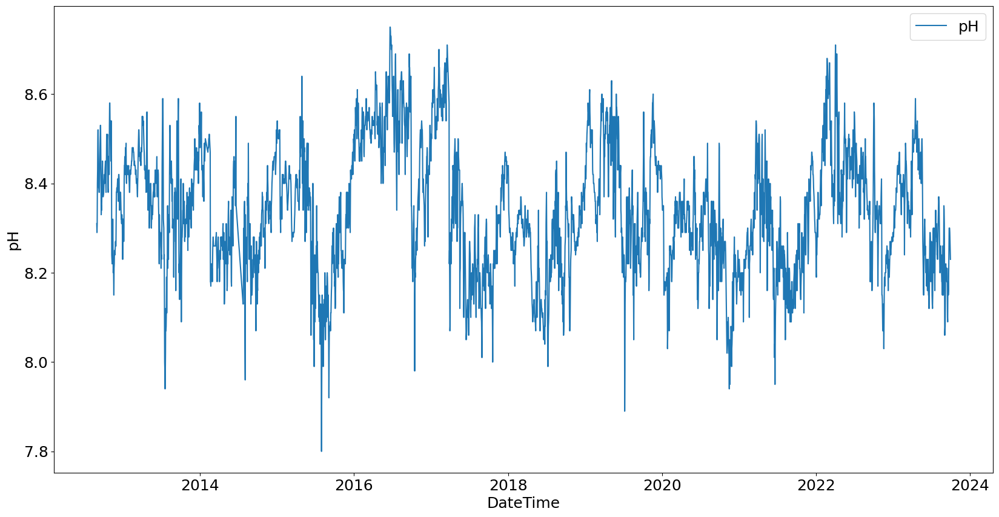

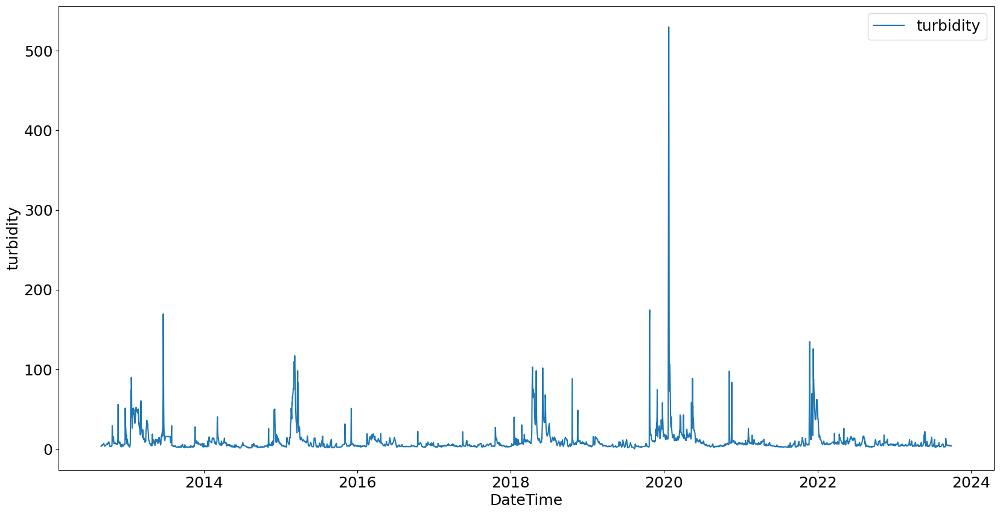

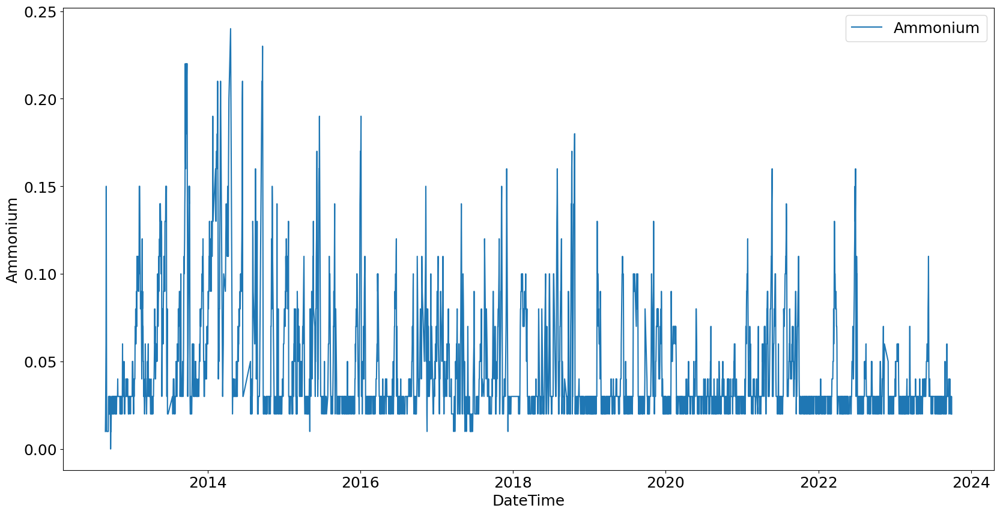

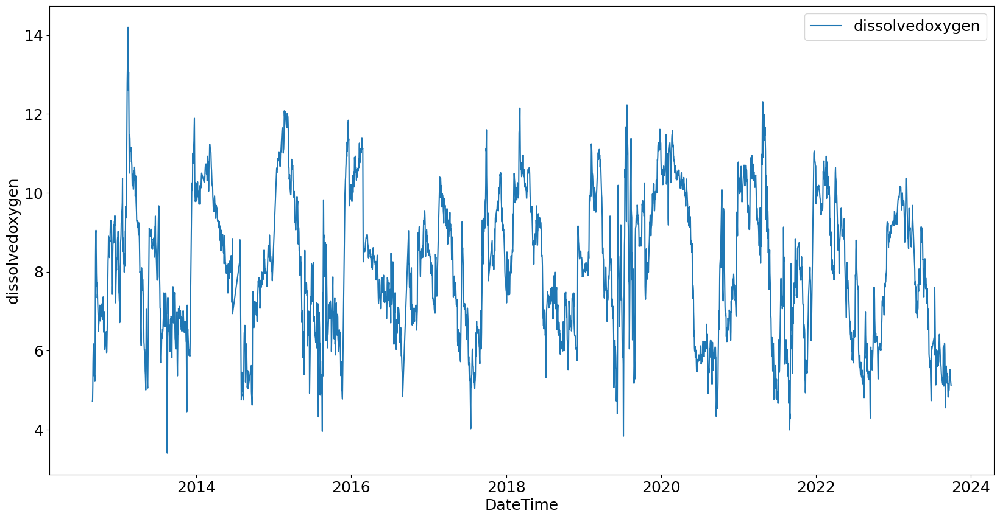

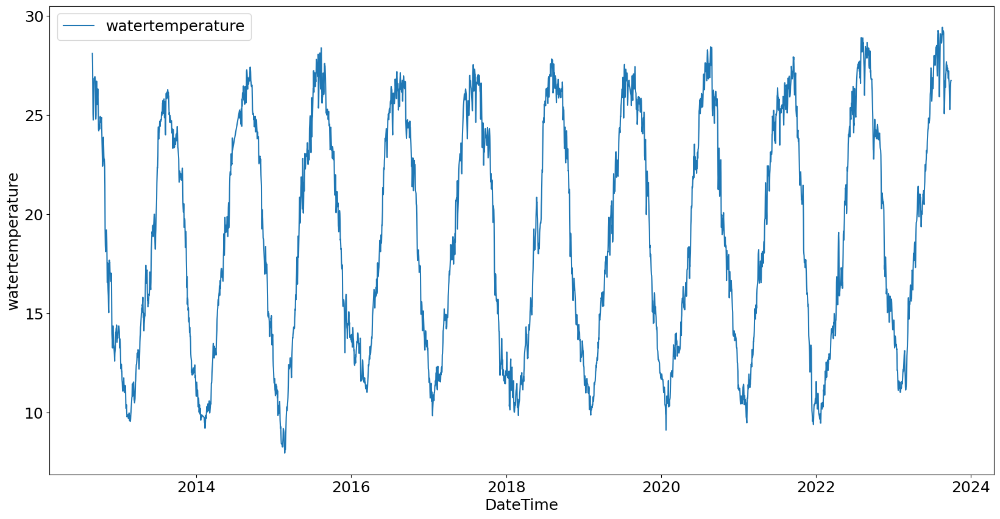

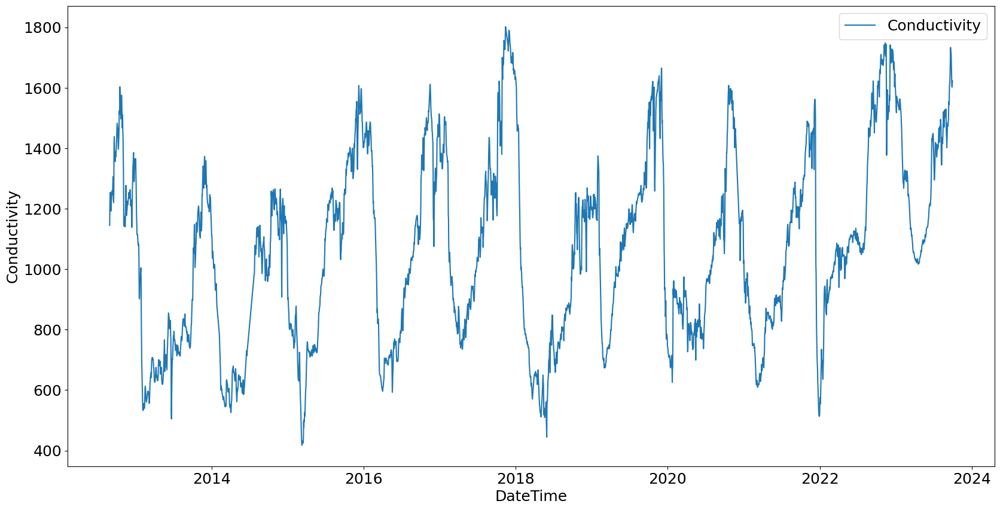

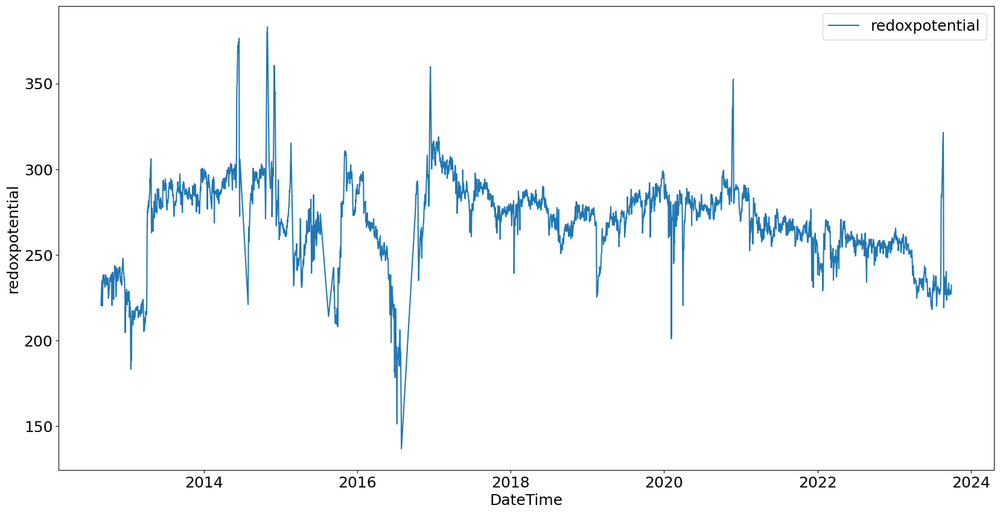

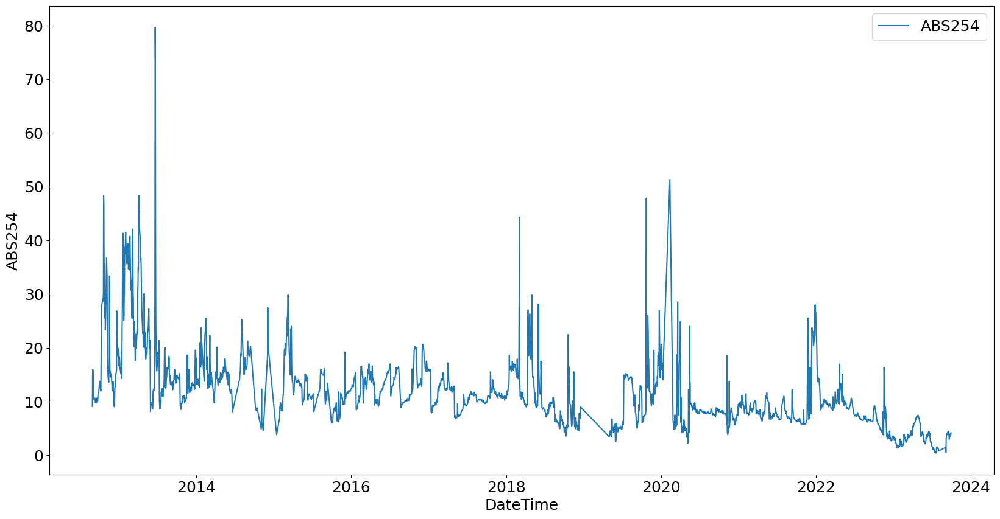

In [83]:
for feature in xerta_df.columns[1:]:
    plt.figure()
    sns.lineplot(x="DateTime", y=feature, data=xerta_df, label=feature)

<Axes: ylabel='ABS254'>

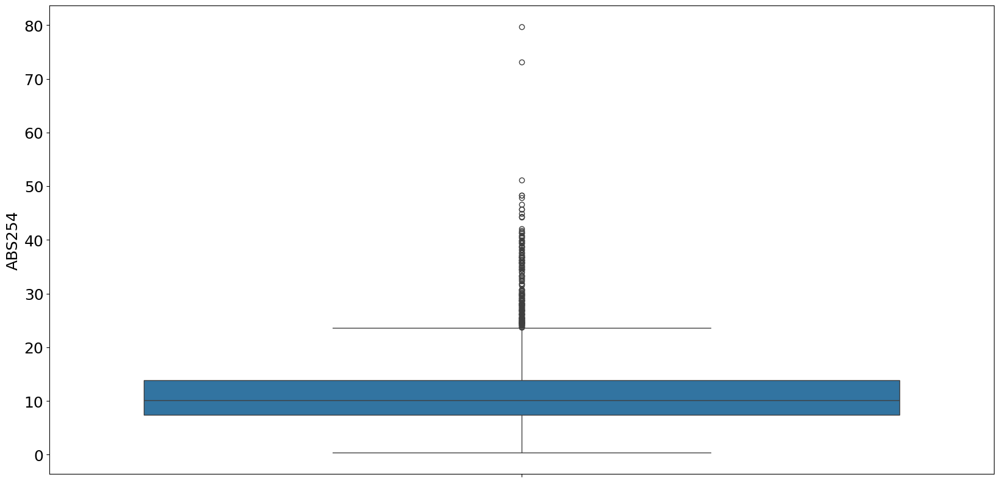

In [84]:
sns.boxplot(data=xerta_df["ABS254"])

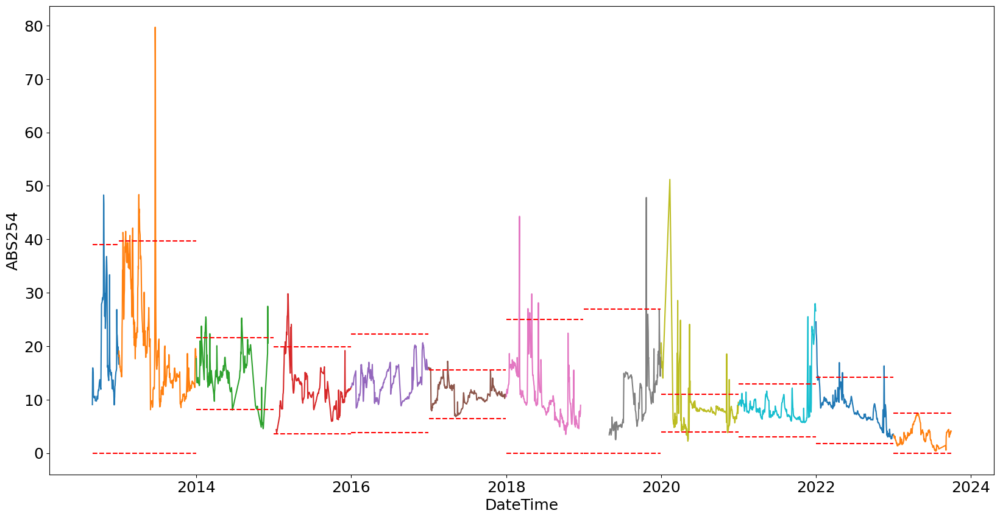

In [85]:
for year in xerta_df["DateTime"].dt.year.unique():
    quartile_1, quartile_3 = xerta_df[
        xerta_df["DateTime"].dt.year == year
    ]["ABS254"].quantile([0.25, 0.75])

    iqr = quartile_3 - quartile_1

    lower_bound = max(quartile_1 - 1.5 * iqr, 0)
    upper_bound = quartile_3 + 1.5 * iqr

    year_data = xerta_df[xerta_df["DateTime"].dt.year == year]

    sns.lineplot(x="DateTime", y="ABS254", data=year_data)
    sns.lineplot(
        x=year_data["DateTime"],
        y=[lower_bound] * len(year_data),
        color="red",
        linestyle="--",
    )
    sns.lineplot(
        x=year_data["DateTime"],
        y=[upper_bound] * len(year_data),
        color="red",
        linestyle="--",
    )

In [86]:
# mark the outliers
abs_df = xerta_df[["DateTime", "ABS254"]].copy()
abs_df["is_outlier"] = False

for year in xerta_df["DateTime"].dt.year.unique():
    quartile_1, quartile_3 = abs_df[abs_df["DateTime"].dt.year == year][
        "ABS254"
    ].quantile([0.25, 0.75])

    iqr = quartile_3 - quartile_1

    lower_bound = max(quartile_1 - 1.5 * iqr, 0)
    upper_bound = quartile_3 + 1.5 * iqr

    abs_df.loc[abs_df["DateTime"].dt.year == year, "is_outlier"] = abs_df[abs_df["DateTime"].dt.year == year]["ABS254"] > upper_bound
    

In [87]:
abs_df["is_outlier"] = abs_df["is_outlier"].astype(int)

<Axes: xlabel='DateTime', ylabel='ABS254'>

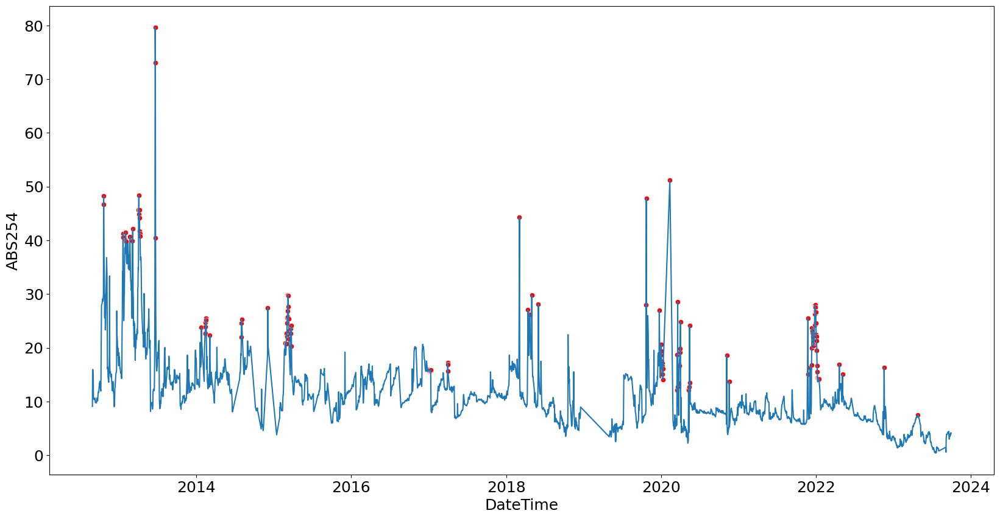

In [88]:
sns.lineplot(x="DateTime", y="ABS254", data=abs_df)
sns.scatterplot(
    x="DateTime",
    y="ABS254",
    data=abs_df[abs_df["is_outlier"] == 1],
    color="red",
)

# Build Unique Dataset

In [89]:
tortosa_df.columns.to_list()

['DateTime',
 'cumulated_rainfall_24h',
 'watertemperature',
 'conductivity',
 'flowriver']

In [90]:
guiamets_df.columns.to_list()

['DateTime', 'cumulated_rainfall_24h', 'environmental_temperature']

In [91]:
xerta_df['cumulated_rainfall_24h'] = tortosa_df['cumulated_rainfall_24h']
xerta_df['flowriver'] = tortosa_df['flowriver']
xerta_df['environmental_temperature'] = guiamets_df['environmental_temperature']

# xerta_df['is_outlier'] = abs_df['is_outlier']

In [94]:
xerta_df.to_excel(os.path.join(raw_data_folder, "raw_full_dataset.xlsx"), index=False)

# ABS Outliers Analysis

In [38]:
xerta_df['Year'] = xerta_df['DateTime'].dt.year

In [39]:
# Add a timestamp column
xerta_df["Timestamp"] = xerta_df["DateTime"].apply(lambda x: x.timestamp())

In [40]:
full_df = xerta_df.copy()

In [41]:
full_df.columns.to_list()

['DateTime',
 'nitrate',
 'pH',
 'turbidity',
 'Ammonium',
 'dissolvedoxygen',
 'watertemperature',
 'Conductivity',
 'redoxpotential',
 'ABS254',
 'cumulated_rainfall_24h',
 'flowriver',
 'environmental_temperature',
 'is_outlier',
 'Year',
 'Timestamp']

In [42]:
full_df.rename(
    columns={
        "flowriver": "Flow River",
        "cumulated_rainfall_24h": "Daily Cumulated Rainfall",
        "environmental_temperature": "Air Temperature",
        'nitrate': 'Nitrate',
        'dissolvedoxygen': 'Dissolved Oxygen',
        'turbidity': 'Turbidity',
        'watertemperature': 'Water Temperature',
        'redoxpotential': 'Redox Potential',
        'ABS254': 'Absorbance 254nm',
    },
    inplace=True,
)

In [43]:
# Check for missing values and drop them
full_df.isna().sum()

DateTime                      0
Nitrate                     176
pH                           99
Turbidity                   218
Ammonium                    413
Dissolved Oxygen            325
Water Temperature            86
Conductivity                141
Redox Potential             273
Absorbance 254nm            551
Daily Cumulated Rainfall     10
Flow River                   46
Air Temperature               1
is_outlier                    0
Year                          0
Timestamp                     0
dtype: int64

In [44]:
full_df = full_df.dropna()

In [393]:
aic_dict = {}

# Timestamp

In [45]:
formula = 'is_outlier ~ Timestamp'

In [46]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [47]:
results = logit_model.fit(maxiter=10000)

In [48]:
print(results.summary2())

               Results: Generalized linear model
Model:              GLM              AIC:            944.9285   
Link Function:      Logit            BIC:            -19771.6346
Dependent Variable: is_outlier       Log-Likelihood: -470.46    
Date:               2024-03-12 08:45 LL-Null:        -472.47    
No. Observations:   2632             Deviance:       940.93     
Df Model:           1                Pearson chi2:   2.63e+03   
Df Residuals:       2630             Scale:          1.0000     
Method:             IRLS                                        
-----------------------------------------------------------------
              Coef.   Std.Err.     z     P>|z|    [0.025   0.975]
-----------------------------------------------------------------
Intercept    -0.3042    1.3854  -0.2196  0.8262  -3.0196   2.4111
Timestamp    -0.0000    0.0000  -2.0006  0.0454  -0.0000  -0.0000



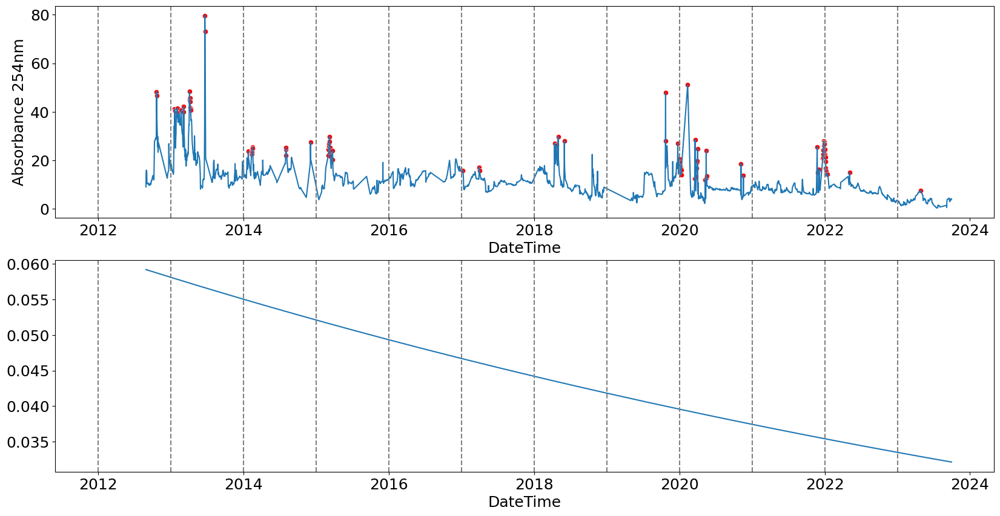

In [49]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

# Timestamp + Year

In [50]:
formula = 'is_outlier ~ Timestamp + Year'

In [51]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [52]:
results = logit_model.fit(maxiter=10000)

In [53]:
print(results.summary2())

                Results: Generalized linear model
Model:                GLM              AIC:            890.6214   
Link Function:        Logit            BIC:            -19825.9418
Dependent Variable:   is_outlier       Log-Likelihood: -443.31    
Date:                 2024-03-12 08:47 LL-Null:        -472.47    
No. Observations:     2632             Deviance:       886.62     
Df Model:             1                Pearson chi2:   3.39e+03   
Df Residuals:         2630             Scale:          1.0000     
Method:               IRLS                                        
------------------------------------------------------------------
            Coef.    Std.Err.    z    P>|z|    [0.025     0.975]  
------------------------------------------------------------------
Intercept -5258.3392 774.4850 -6.7895 0.0000 -6776.3018 -3740.3766
Timestamp    -0.0000   0.0000 -6.9227 0.0000    -0.0000    -0.0000
Year          2.6692   0.3931  6.7895 0.0000     1.8987     3.4398



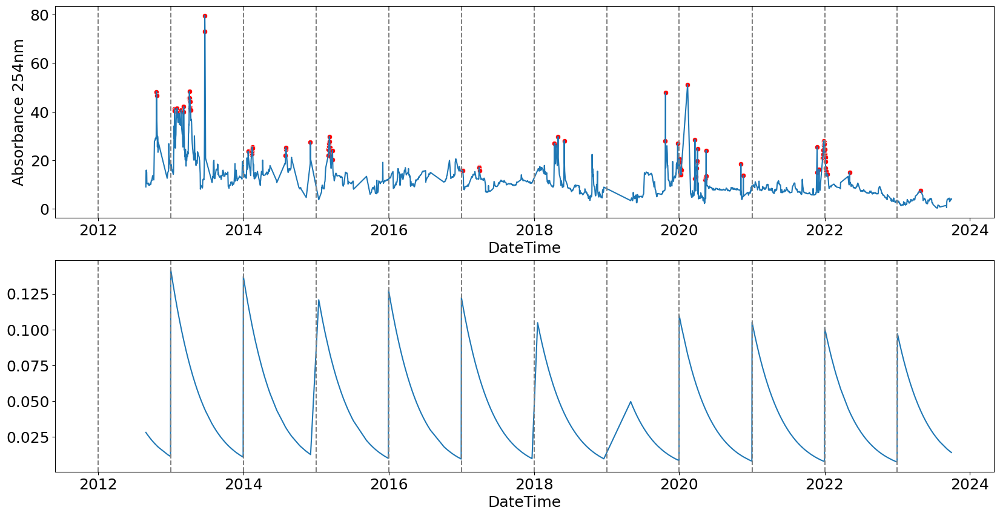

In [54]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

# Timestamp + Timestamp:Year + Year + All Features 

In [394]:
formula = 'is_outlier ~ Timestamp + Timestamp:Year + Year + Q("Water Temperature") + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + pH + Conductivity + Q("Flow River") + Nitrate + Ammonium + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [395]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [396]:
results = logit_model.fit(maxiter=10000)

In [397]:
print(results.summary2())

                      Results: Generalized linear model
Model:                   GLM                  AIC:                487.6261   
Link Function:           Logit                BIC:                -20187.8085
Dependent Variable:      is_outlier           Log-Likelihood:     -234.81    
Date:                    2024-03-12 00:20     LL-Null:            -472.47    
No. Observations:        2632                 Deviance:           469.63     
Df Model:                8                    Pearson chi2:       1.63e+04   
Df Residuals:            2623                 Scale:              1.0000     
Method:                  IRLS                                                
-----------------------------------------------------------------------------
                               Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
-----------------------------------------------------------------------------
Intercept                      0.0003   0.0003  0.8251 0.4093 -0.0004  0.0010
Timestam

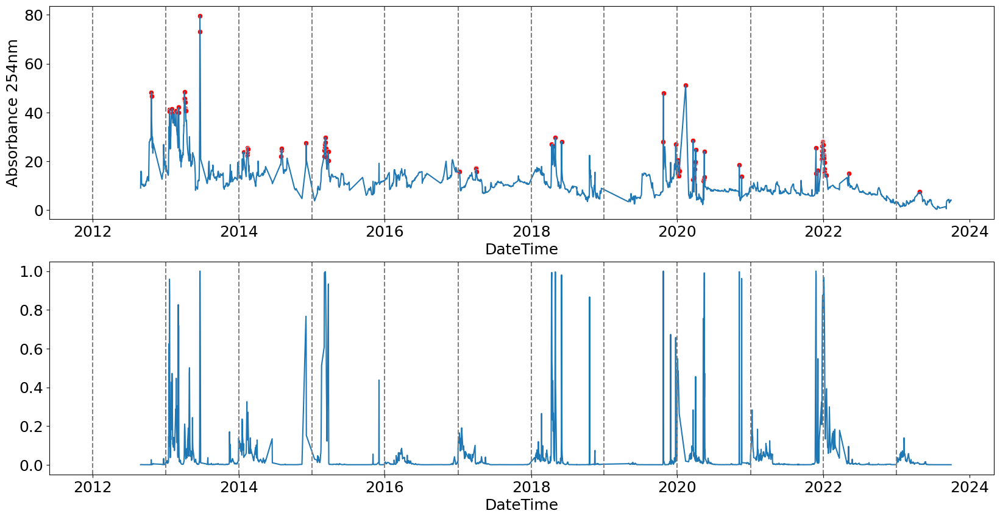

In [398]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

In [399]:
aic_dict['Timestamp + Timestamp:Year + Year + All Features'] = results.aic

# Timestamp:Year + C(Year) + All Features

Timestamp + Timestamp:Year + C(Year) + All Features si rompe

In [400]:
formula = 'is_outlier ~ Timestamp:Year + C(Year) + Q("Water Temperature") + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + pH + Conductivity + Q("Flow River") + Nitrate + Ammonium + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [401]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [402]:
results = logit_model.fit(maxiter=10000)

In [403]:
print(results.summary2())

                       Results: Generalized linear model
Model:                   GLM                   AIC:                 385.5796   
Link Function:           Logit                 BIC:                 -20295.7305
Dependent Variable:      is_outlier            Log-Likelihood:      -184.79    
Date:                    2024-03-12 00:23      LL-Null:             -472.47    
No. Observations:        2632                  Deviance:            369.58     
Df Model:                7                     Pearson chi2:        7.64e+03   
Df Residuals:            2624                  Scale:               1.0000     
Method:                  IRLS                                                  
-------------------------------------------------------------------------------
                               Coef.  Std.Err.    z    P>|z|   [0.025   0.975] 
-------------------------------------------------------------------------------
Intercept                     78.2779  41.2910  1.8958 0.0580  

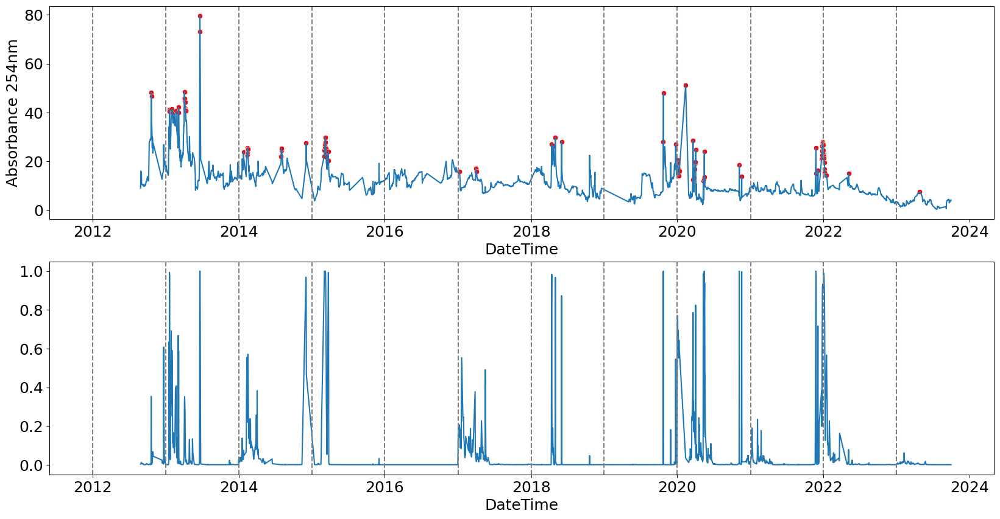

In [404]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

In [405]:
aic_dict['Timestamp:Year + C(Year) + All Features'] = results.aic

# Remove Ammonium

In [406]:
formula = 'is_outlier ~ Timestamp:Year + C(Year) + Q("Water Temperature") + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + pH + Conductivity + Q("Flow River") + Nitrate + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [407]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [408]:
results = logit_model.fit(maxiter=10000)

In [409]:
print(results.summary2())

                       Results: Generalized linear model
Model:                   GLM                   AIC:                 385.5950   
Link Function:           Logit                 BIC:                 -20295.7151
Dependent Variable:      is_outlier            Log-Likelihood:      -184.80    
Date:                    2024-03-12 00:26      LL-Null:             -472.47    
No. Observations:        2632                  Deviance:            369.60     
Df Model:                7                     Pearson chi2:        7.30e+03   
Df Residuals:            2624                  Scale:               1.0000     
Method:                  IRLS                                                  
-------------------------------------------------------------------------------
                               Coef.  Std.Err.    z    P>|z|   [0.025   0.975] 
-------------------------------------------------------------------------------
Intercept                     79.0476  40.8385  1.9356 0.0529  

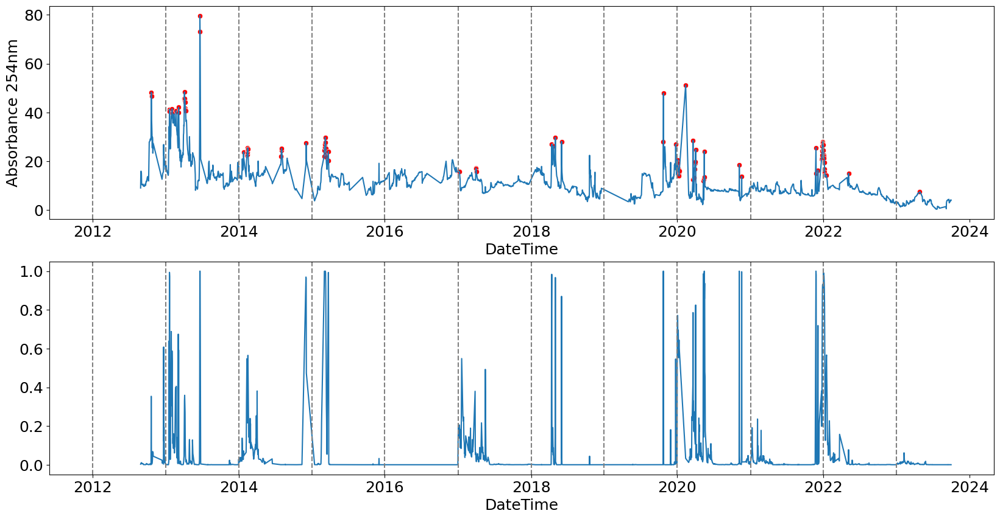

In [410]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

In [411]:
aic_dict['Timestamp:Year + C(Year) - Ammonium'] = results.aic

# Remove Nitrate

In [412]:
formula = 'is_outlier ~ Timestamp:Year + C(Year) + Q("Water Temperature") + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + pH + Conductivity + Q("Flow River") + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [413]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [414]:
results = logit_model.fit(maxiter=10000)

In [415]:
print(results.summary2())

                       Results: Generalized linear model
Model:                   GLM                   AIC:                 389.6599   
Link Function:           Logit                 BIC:                 -20297.5257
Dependent Variable:      is_outlier            Log-Likelihood:      -187.83    
Date:                    2024-03-12 00:30      LL-Null:             -472.47    
No. Observations:        2632                  Deviance:            375.66     
Df Model:                6                     Pearson chi2:        6.53e+03   
Df Residuals:            2625                  Scale:               1.0000     
Method:                  IRLS                                                  
-------------------------------------------------------------------------------
                               Coef.   Std.Err.    z    P>|z|   [0.025   0.975]
-------------------------------------------------------------------------------
Intercept                       1.8185   3.5354  0.5144 0.6070 

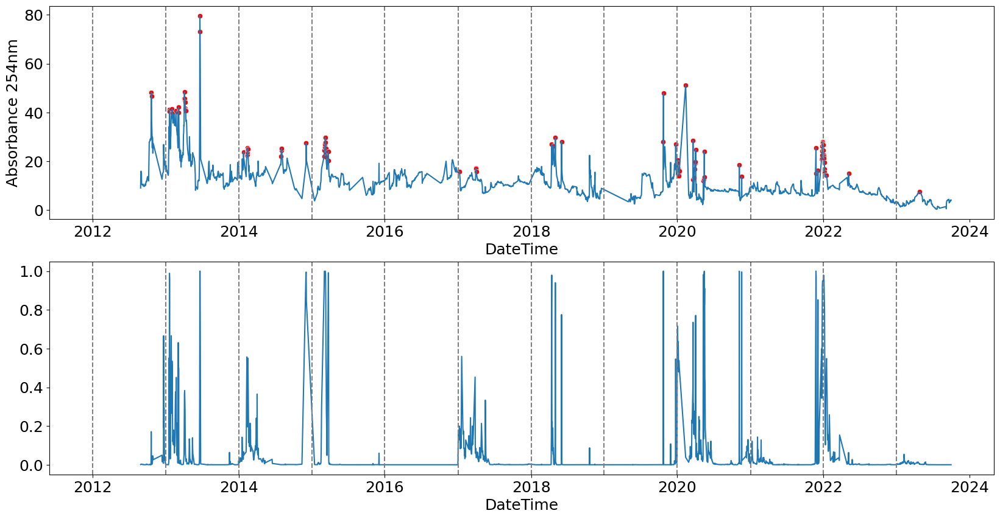

In [416]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

In [417]:
aic_dict['Timestamp:Year + C(Year) - Ammonium - Nitrate'] = results.aic

# Remove Flow River

In [418]:
formula = 'is_outlier ~ Timestamp:Year + C(Year) + Q("Water Temperature") + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + pH + Conductivity + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [419]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [420]:
results = logit_model.fit(maxiter=10000)

In [421]:
print(results.summary2())

                       Results: Generalized linear model
Model:                   GLM                   AIC:                 388.5415   
Link Function:           Logit                 BIC:                 -20304.5196
Dependent Variable:      is_outlier            Log-Likelihood:      -188.27    
Date:                    2024-03-12 00:32      LL-Null:             -472.47    
No. Observations:        2632                  Deviance:            376.54     
Df Model:                5                     Pearson chi2:        7.15e+03   
Df Residuals:            2626                  Scale:               1.0000     
Method:                  IRLS                                                  
-------------------------------------------------------------------------------
                               Coef.   Std.Err.    z    P>|z|   [0.025   0.975]
-------------------------------------------------------------------------------
Intercept                       2.4412   4.6561  0.5243 0.6001 

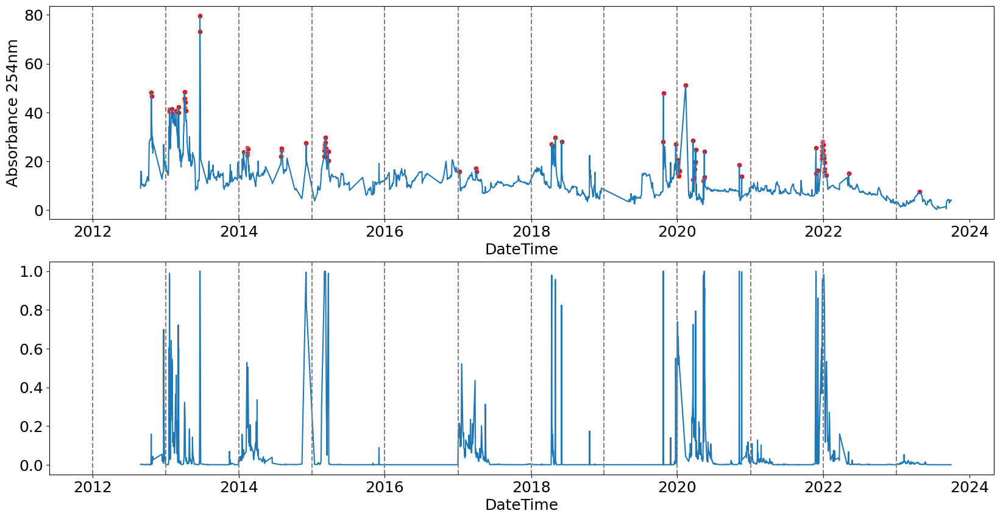

In [422]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

In [423]:
aic_dict['Timestamp:Year + C(Year) - Ammonium - Nitrate - Flow River'] = results.aic

# Remove pH

In [424]:
formula = 'is_outlier ~ Timestamp:Year + C(Year) + Q("Water Temperature") + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + Conductivity + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [425]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [426]:
results = logit_model.fit(maxiter=10000)

In [427]:
print(results.summary2())

                       Results: Generalized linear model
Model:                   GLM                   AIC:                 385.3142   
Link Function:           Logit                 BIC:                 -20307.7470
Dependent Variable:      is_outlier            Log-Likelihood:      -186.66    
Date:                    2024-03-12 00:36      LL-Null:             -472.47    
No. Observations:        2632                  Deviance:            373.31     
Df Model:                5                     Pearson chi2:        5.90e+03   
Df Residuals:            2626                  Scale:               1.0000     
Method:                  IRLS                                                  
-------------------------------------------------------------------------------
                               Coef.  Std.Err.    z    P>|z|   [0.025   0.975] 
-------------------------------------------------------------------------------
Intercept                     96.4013  38.9088  2.4776 0.0132  

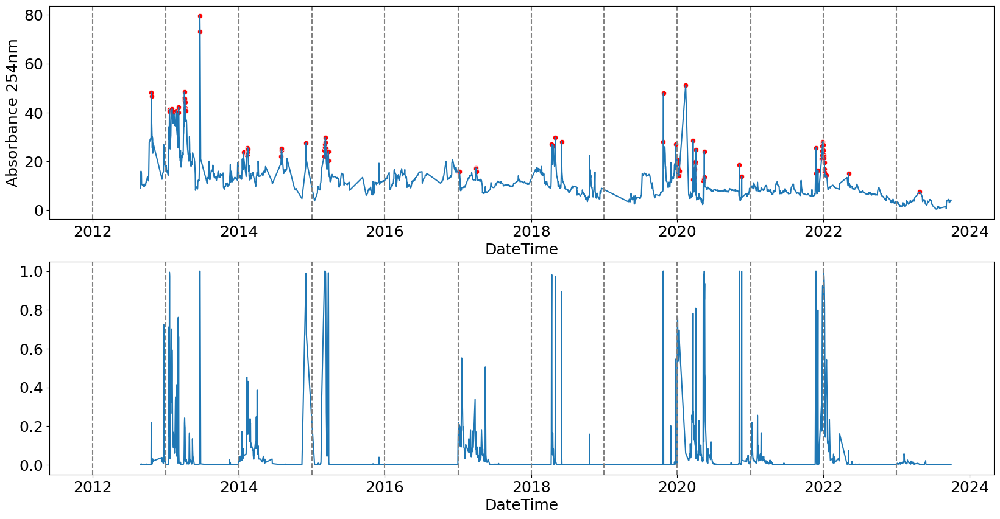

In [428]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

In [429]:
aic_dict['Timestamp:Year + C(Year) - Ammonium - Nitrate - Flow River - pH'] = results.aic

# Remove Water Temperature

In [430]:
formula = 'is_outlier ~ Timestamp:Year + C(Year) + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + Conductivity + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [431]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [432]:
results = logit_model.fit(maxiter=10000)

In [433]:
print(results.summary2())

                       Results: Generalized linear model
Model:                    GLM                   AIC:                 388.3143   
Link Function:            Logit                 BIC:                 -20304.7469
Dependent Variable:       is_outlier            Log-Likelihood:      -188.16    
Date:                     2024-03-12 00:39      LL-Null:             -472.47    
No. Observations:         2632                  Deviance:            376.31     
Df Model:                 5                     Pearson chi2:        3.77e+03   
Df Residuals:             2626                  Scale:               1.0000     
Method:                   IRLS                                                  
--------------------------------------------------------------------------------
                               Coef.   Std.Err.    z    P>|z|   [0.025   0.975] 
--------------------------------------------------------------------------------
Intercept                     102.1022  39.4789  2.5

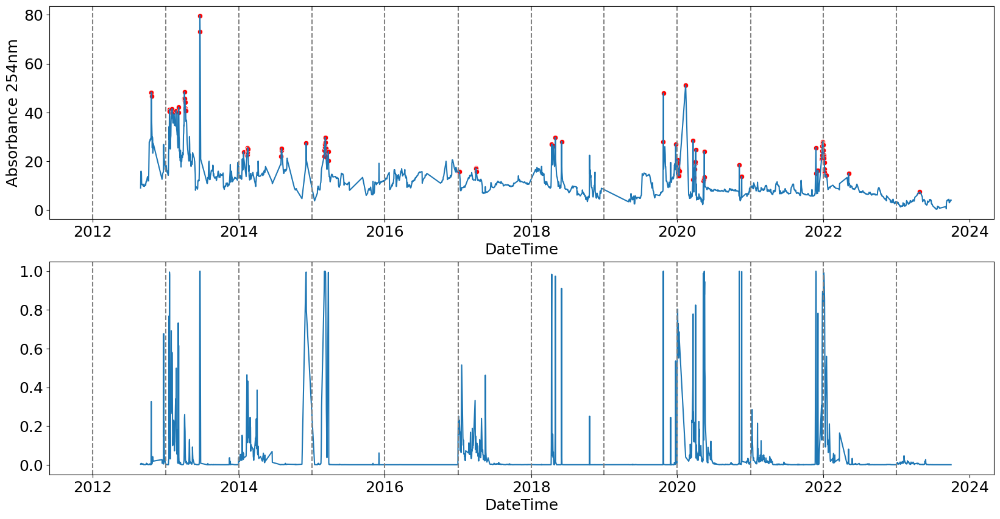

In [434]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

In [435]:
aic_dict['Timestamp:Year + C(Year) - Ammonium - Nitrate - Flow River - pH - Water Temperature'] = results.aic

# Set Years with p-value > 0.05 to 2012

In [436]:
# the years are 2014, 2015, 2016, 2018, 2019
# set these years to 2012
change_full_df = full_df.copy()
change_full_df.loc[change_full_df['Year'].isin([2014, 2015, 2016, 2018, 2019]), 'Year'] = 2012

In [437]:
formula = 'is_outlier ~ Timestamp:Year + C(Year) + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + Conductivity + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [438]:
logit_model = sm.GLM.from_formula(formula=formula, data=change_full_df, family=sm.families.Binomial())

In [439]:
results = logit_model.fit(maxiter=10000)

In [440]:
print(results.summary2())

                      Results: Generalized linear model
Model:                   GLM                  AIC:                403.6541   
Link Function:           Logit                BIC:                -20289.4070
Dependent Variable:      is_outlier           Log-Likelihood:     -195.83    
Date:                    2024-03-12 00:39     LL-Null:            -472.47    
No. Observations:        2632                 Deviance:           391.65     
Df Model:                5                    Pearson chi2:       5.20e+03   
Df Residuals:            2626                 Scale:              1.0000     
Method:                  IRLS                                                
-----------------------------------------------------------------------------
                               Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
-----------------------------------------------------------------------------
Intercept                     67.2937  11.0177  6.1078 0.0000 45.6995 88.8880
C(Year)[

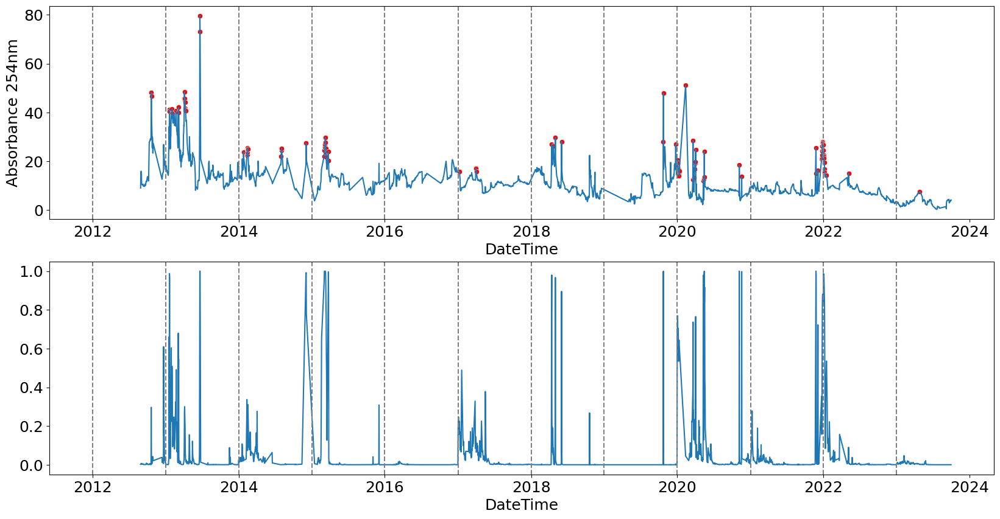

In [441]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

In [442]:
aic_dict['Timestamp:Year + C(Year) - Ammonium - Nitrate - Flow River - pH - Water Temperature - Non Significant Years'] = results.aic

# See Results and choose best AIC

In [443]:
aic_df = pd.DataFrame(aic_dict.items(), columns=['Model', 'AIC'])

In [444]:
aic_df

,Model,AIC
0,Timestamp + Timestamp:Year + Year + All Features,487.626124
1,Timestamp:Year + C(Year) + All Features,385.579596
2,Timestamp:Year + C(Year) - Ammonium,385.595000
3,Timestamp:Year + C(Year) - Ammonium - Nitrate,389.659946
4,Timestamp:Year + C(Year) - Ammonium - Nitrate ...,388.541548
5,Timestamp:Year + C(Year) - Ammonium - Nitrate ...,385.314167
6,Timestamp:Year + C(Year) - Ammonium - Nitrate ...,388.314273
7,Timestamp:Year + C(Year) - Ammonium - Nitrate ...,403.654133


In [445]:
# The one with all the features has almost the lowest AIC and it has the maximum likelihood
# so we will use it

In [446]:
formula = 'is_outlier ~ Timestamp:Year + C(Year) + Q("Water Temperature") + Q("Daily Cumulated Rainfall") + Q("Air Temperature") + pH + Conductivity + Q("Flow River") + Nitrate + Ammonium + Q("Dissolved Oxygen") + Turbidity + Q("Redox Potential")'

In [447]:
logit_model = sm.GLM.from_formula(formula=formula, data=full_df, family=sm.families.Binomial())

In [448]:
results = logit_model.fit(maxiter=10000)

In [449]:
print(results.summary2())

                       Results: Generalized linear model
Model:                   GLM                   AIC:                 385.5796   
Link Function:           Logit                 BIC:                 -20295.7305
Dependent Variable:      is_outlier            Log-Likelihood:      -184.79    
Date:                    2024-03-12 00:42      LL-Null:             -472.47    
No. Observations:        2632                  Deviance:            369.58     
Df Model:                7                     Pearson chi2:        7.64e+03   
Df Residuals:            2624                  Scale:               1.0000     
Method:                  IRLS                                                  
-------------------------------------------------------------------------------
                               Coef.  Std.Err.    z    P>|z|   [0.025   0.975] 
-------------------------------------------------------------------------------
Intercept                     78.2779  41.2910  1.8958 0.0580  

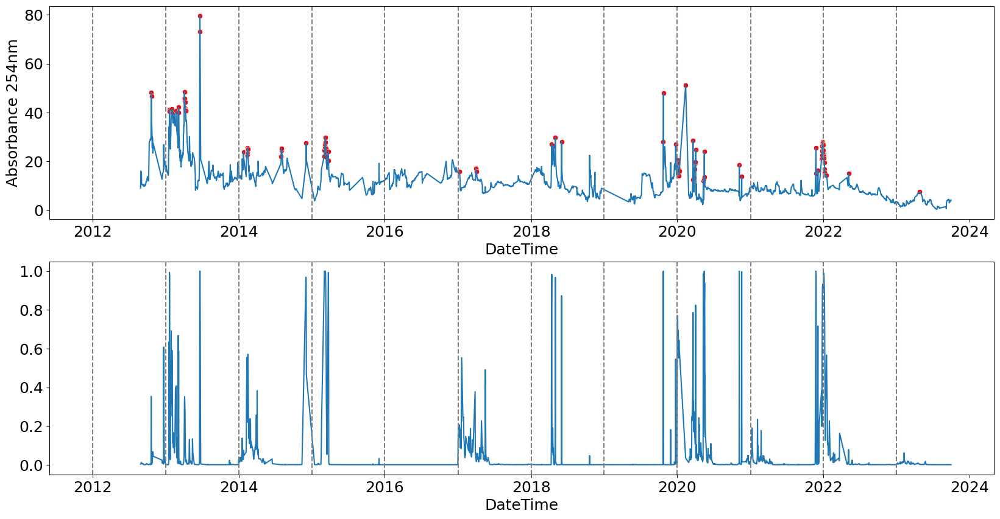

In [450]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(x='DateTime', y='Absorbance 254nm', data=full_df, ax=axs[0])
sns.scatterplot(x=full_df['DateTime'], y=full_df[full_df['is_outlier'] == 1]['Absorbance 254nm'], ax=axs[0], color='red')
sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

# plot vertical lines for the years on the entire plot
for year in full_df['DateTime'].dt.year.unique():
    for ax in axs:
        ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')

plt.show()

# Trend Analysis of probabilities

In [451]:
import statsmodels.tsa.seasonal as smt

In [452]:
# create dataframe with datetime and the fitted values
fitted_df = pd.DataFrame()
fitted_df['DateTime'] = full_df['DateTime']
fitted_df['Probabilities'] = results.fittedvalues

In [453]:
# set the datetime as the index
fitted_df.set_index('DateTime', inplace=True)

In [454]:
result = smt.STL(fitted_df['Probabilities'], period=365).fit()

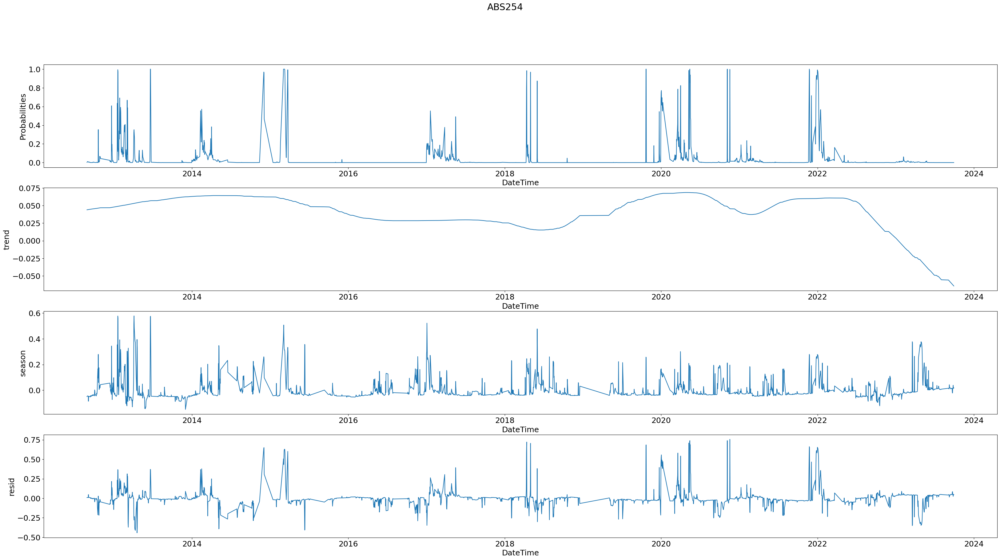

In [455]:
fig, axs = plt.subplots(4, 1, figsize=(40, 20))
sns.lineplot(data=result.observed, ax=axs[0])
sns.lineplot(data=result.trend, ax=axs[1])
sns.lineplot(data=result.seasonal, ax=axs[2])
sns.lineplot(data=result.resid, ax=axs[3])
fig.suptitle(feature)

plt.show()

# Probabilities with other variables

In [456]:
full_df.columns.to_list()

['DateTime',
 'Nitrate',
 'pH',
 'Turbidity',
 'Ammonium',
 'Dissolved Oxygen',
 'Water Temperature',
 'Conductivity',
 'Redox Potential',
 'Absorbance 254nm',
 'Daily Cumulated Rainfall',
 'Flow River',
 'Air Temperature',
 'is_outlier',
 'Year',
 'Timestamp']

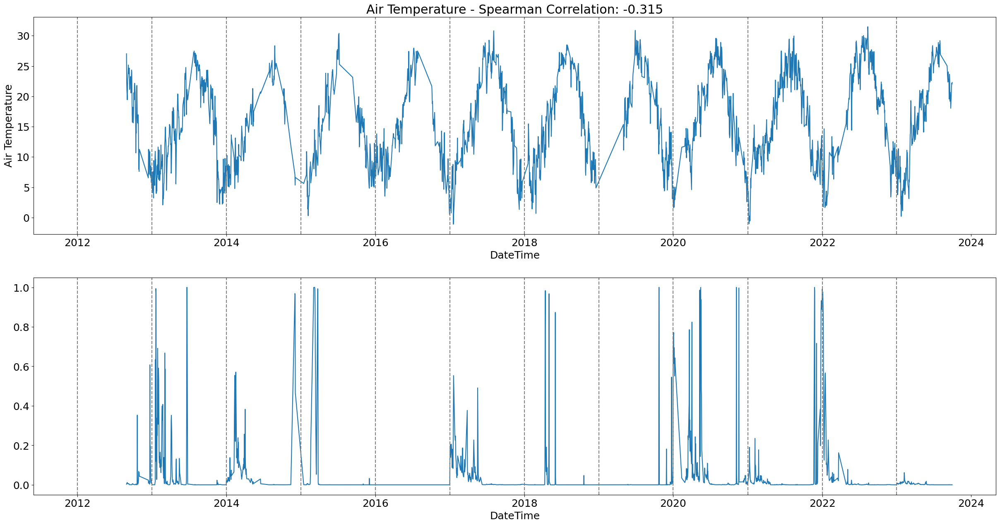

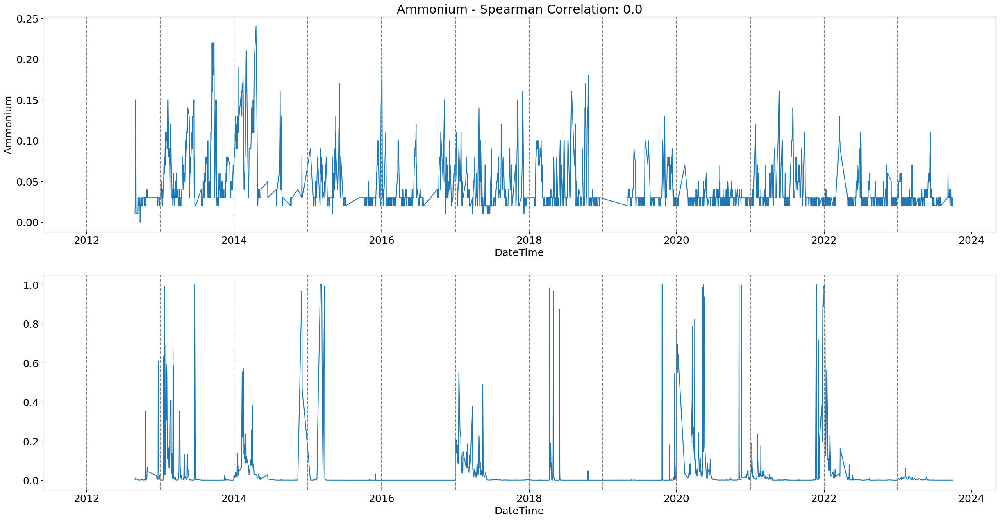

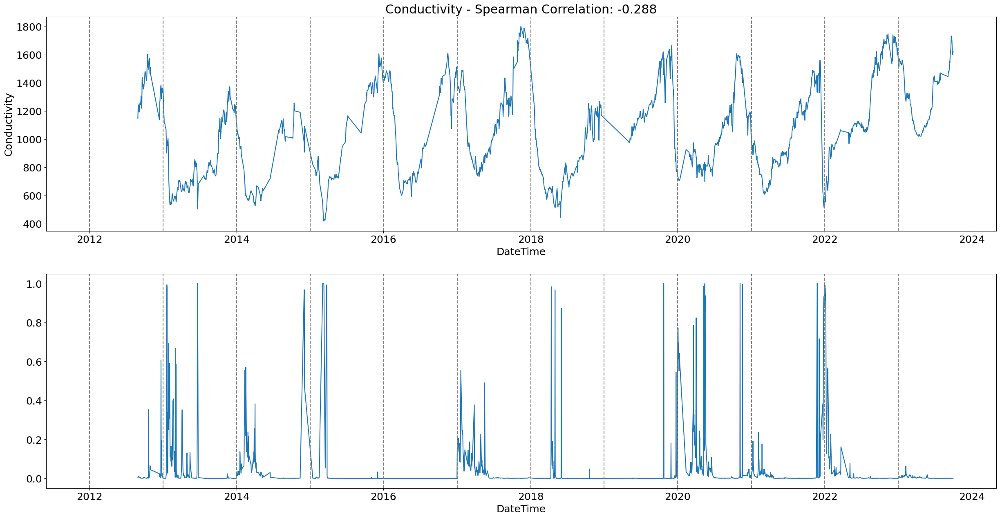

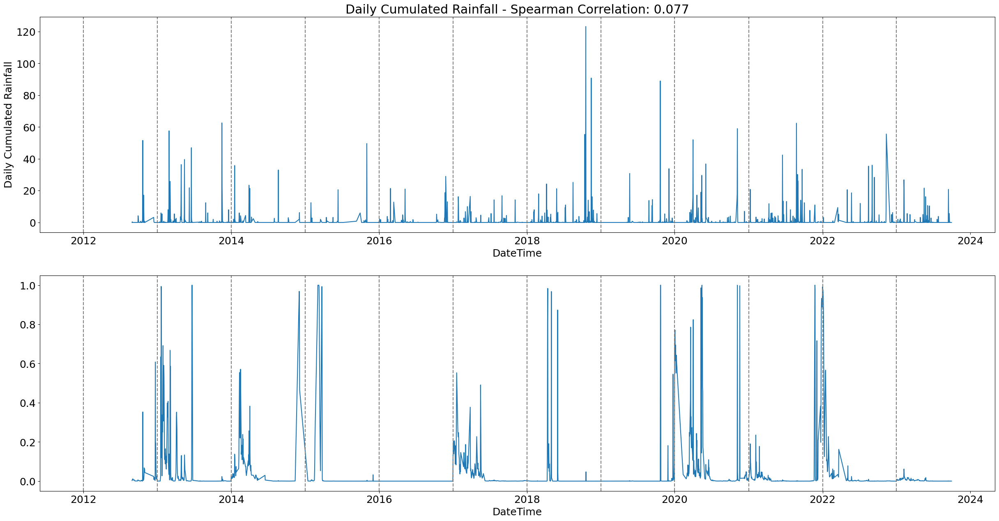

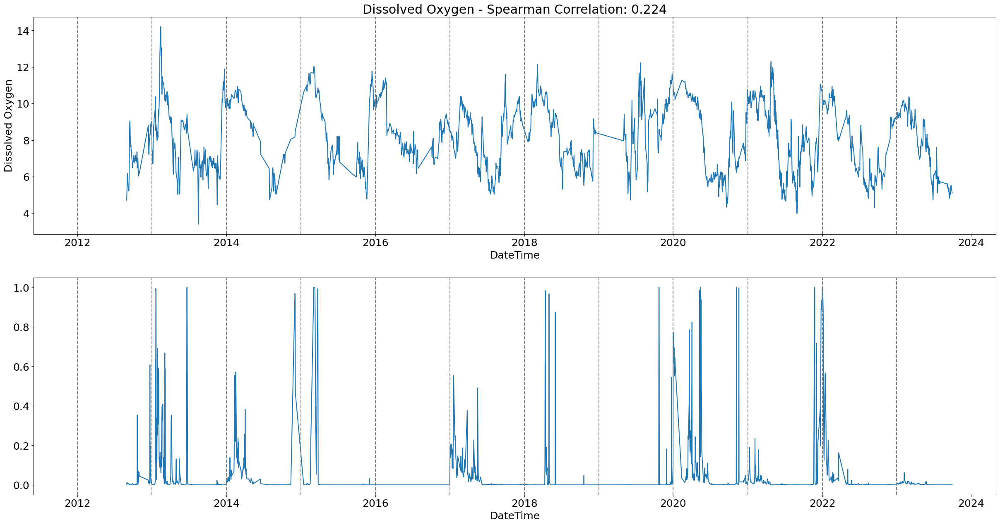

...

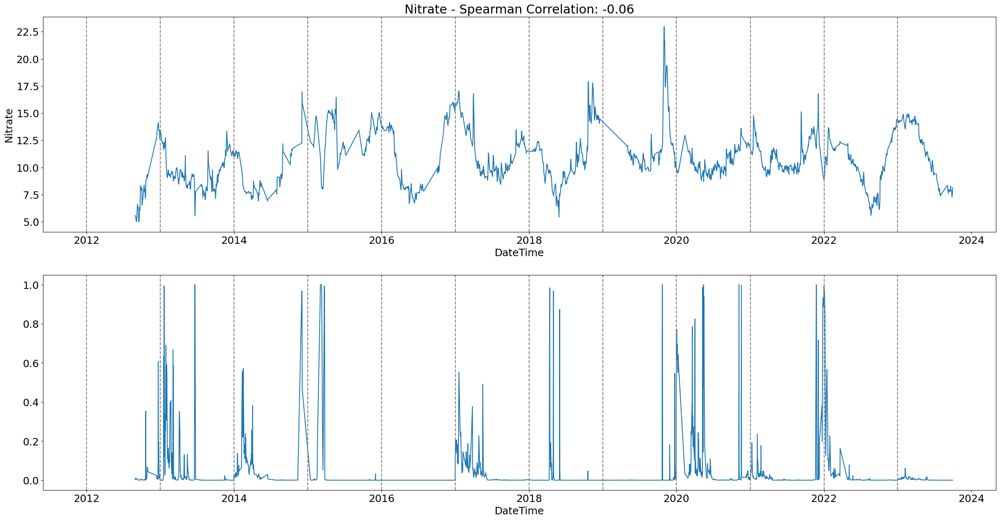

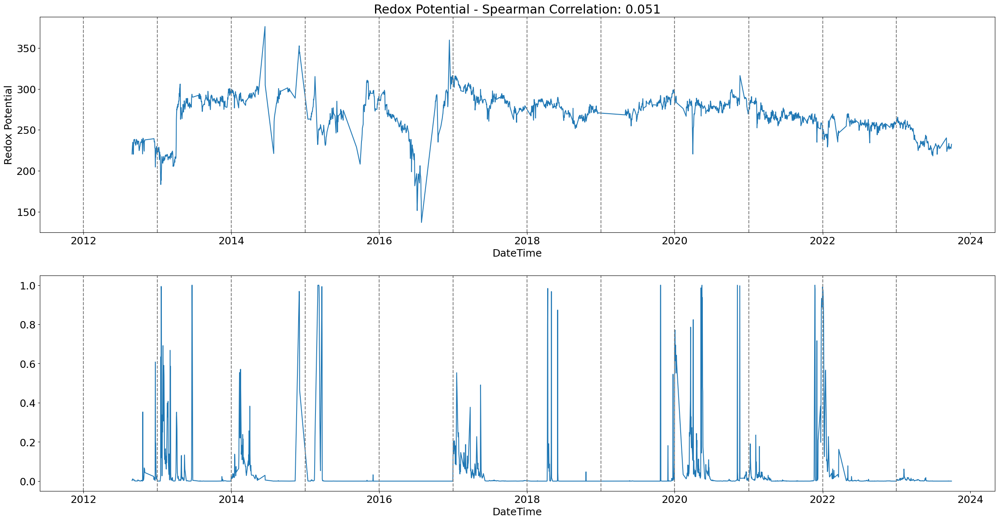

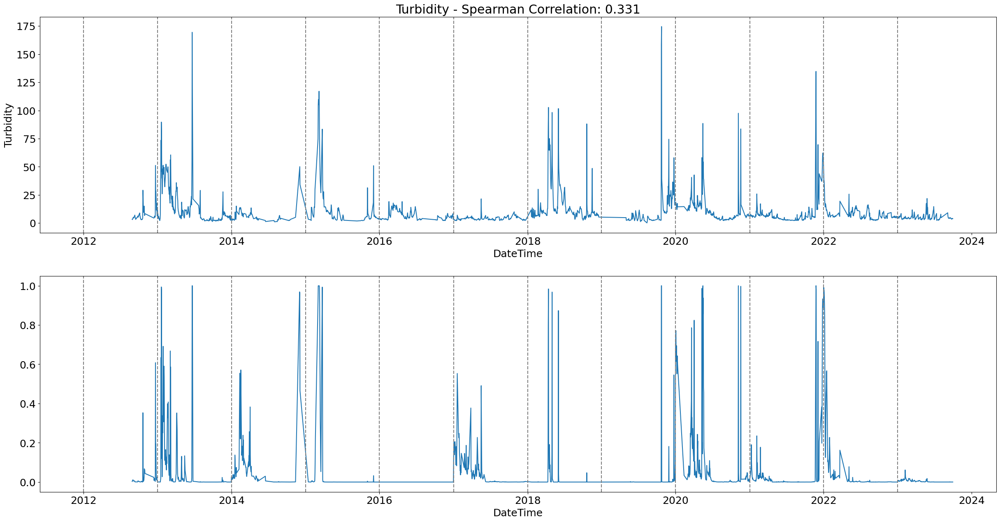

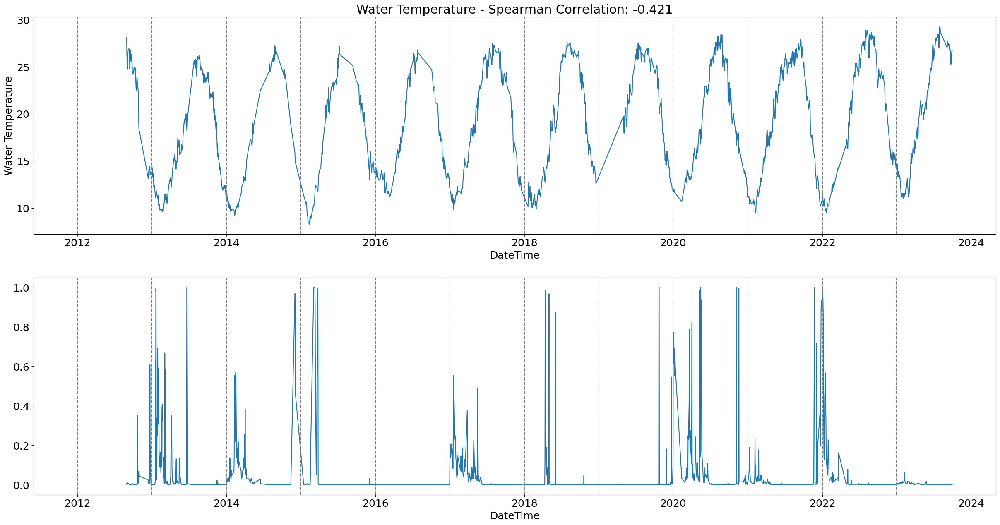

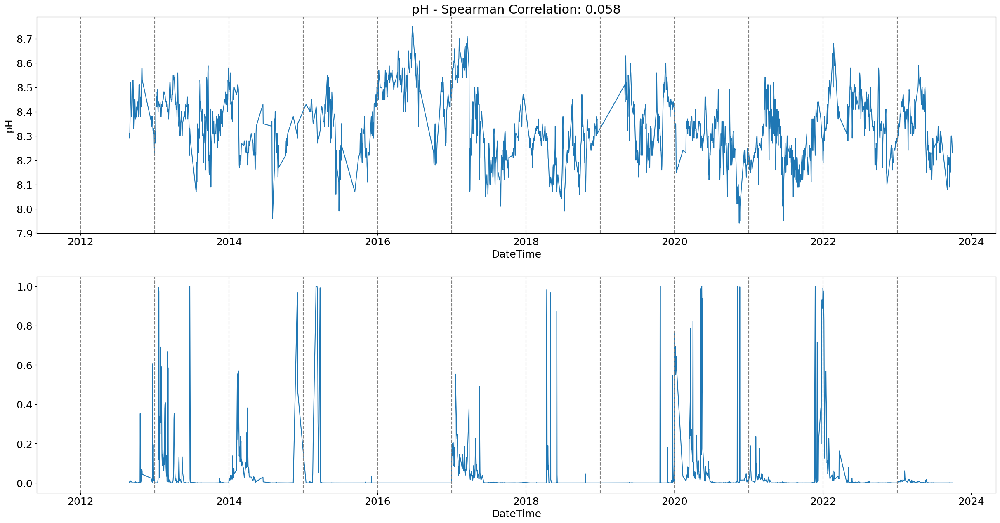

In [464]:
for feature in full_df.columns.difference(['DateTime', 'is_outlier', 'Year', 'Timestamp', 'Absorbance 254nm']):
    fig, axs = plt.subplots(2, 1, figsize=(30, 15))

    sns.lineplot(x='DateTime', y=feature, data=full_df, ax=axs[0])
    sns.lineplot(x=full_df['DateTime'], y=results.fittedvalues.values, ax=axs[1])

    # plot vertical lines for the years on the entire plot
    for year in full_df['DateTime'].dt.year.unique():
        for ax in axs:
            ax.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')
            
    # compute spearman correlation between the feature and the fitted values
    spearman_correlation = full_df[feature].corr(results.fittedvalues, method='spearman')
    axs[0].set_title(f'{feature} - Spearman Correlation: {spearman_correlation.round(3)}')

    plt.savefig(os.path.join(probabilities_folder, f'{feature}.png'))